### This notebook trains MIDAS(poisson based network) on protein_unshared, protein shared, rna shared and rna_unshared

This notebook also train the models in a criss cross manner too.

In [1]:
import numpy as np
import pandas as pd
from scipy.io import mmread
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (6, 4)
import anndata as ad
import scanpy as sc
import torch
import random

In [2]:
def set_random_seed():
    # Example usage:
    seed = 42
    # Set seed for random module
    random.seed(seed)

    # Set seed for numpy
    np.random.seed(seed)

    # Set seed for torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        
set_random_seed()

In [3]:
# read in protein data
protein = pd.read_csv("data/citeseq_pbmc/pro.csv") # 10k cells (protein)
# convert to AnnData
protein_adata = ad.AnnData(
    protein.to_numpy(), dtype=np.float32
)
protein_adata.var_names = protein.columns

# read in celltyle labels
metadata = pd.read_csv('data/citeseq_pbmc/meta.csv')
labels_l1 = metadata['celltype.l1'].to_numpy()
labels_l2 = metadata['celltype.l2'].to_numpy()

protein_adata.obs['celltype.l1'] = labels_l1
protein_adata.obs['celltype.l2'] = labels_l2

print("Final stats of protein adata: \n",protein_adata)

Final stats of protein adata: 
 AnnData object with n_obs × n_vars = 10000 × 224
    obs: 'celltype.l1', 'celltype.l2'


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\anndata\_core\anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [4]:
# read in RNA data
rna = mmread("./data/citeseq_pbmc/rna.txt") # rna count as sparse matrix, 10k cells (RNA)
rna_names = pd.read_csv('./data/citeseq_pbmc/citeseq_rna_names.csv')['names'].to_numpy()
# convert to AnnData
rna_adata = ad.AnnData(
    rna.tocsr(), dtype=np.float32
)
rna_adata.var_names = rna_names

# read in celltyle labels
metadata = pd.read_csv('./data/citeseq_pbmc/meta.csv')
labels_l1 = metadata['celltype.l1'].to_numpy()
labels_l2 = metadata['celltype.l2'].to_numpy()

rna_adata.obs['celltype.l1'] = labels_l1
rna_adata.obs['celltype.l2'] = labels_l2

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\anndata\_core\anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [5]:
rna_protein_correspondence = []
correspondence = pd.read_csv('data/protein_gene_conversion.csv')
for i in range(correspondence.shape[0]):
    curr_protein_name, curr_rna_names = correspondence.iloc[i]
    if curr_protein_name not in protein_adata.var_names:
        continue
    if curr_rna_names.find('Ignore') != -1: # some correspondence ignored eg. protein isoform to one gene
        continue
    curr_rna_names = curr_rna_names.split('/') # eg. one protein to multiple genes
    for r in curr_rna_names:
        if r in rna_adata.var_names:
            rna_protein_correspondence.append([r, curr_protein_name])

rna_protein_correspondence = np.array(rna_protein_correspondence)
print("Number of correspondence matches: ", rna_protein_correspondence.shape)
shared_gene_names_repeated = rna_protein_correspondence.T[0]
shared_protein_names_repeated = rna_protein_correspondence.T[1]
print("Unique shared gene names: {}, Unique shared protein names: {}".format(len(np.unique(shared_gene_names_repeated)), len(np.unique(shared_protein_names_repeated))))

Number of correspondence matches:  (180, 2)
Unique shared gene names: 170, Unique shared protein names: 170


In [6]:
shared_gene_features = list(set(shared_gene_names_repeated))
print("Final shared RNA: ",len(shared_gene_features))
shared_protein_features = list(set(shared_protein_names_repeated))
print("Final share protein: ", len(shared_protein_features))

rna_adata_copy = rna_adata.copy()
sc.pp.normalize_total(rna_adata_copy)
sc.pp.log1p(rna_adata_copy)
sc.pp.highly_variable_genes(rna_adata_copy, n_top_genes=2000)

highly_var_genes = list(set(rna_adata.var_names[rna_adata_copy.var.highly_variable==True]))
highly_var_genes_filtered = [gene for gene in highly_var_genes if gene not in shared_gene_features]

unshared_protein_features = [protein for protein in protein_adata.var_names if protein not in shared_protein_features]
print("Unshared protein features: ", len(unshared_protein_features))
print("variable genes that are not shared: ", len(highly_var_genes_filtered))

Final shared RNA:  170
Final share protein:  170
Unshared protein features:  54
variable genes that are not shared:  1911


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [7]:
def get_indices(feature_names, all_feature_names):
    """Returns the indices of features in 'feature_names' within the 'all_feature_names' list.

    Args:
        feature_names: A list of feature names to find indices for.
        all_feature_names: The complete list of all feature names.

    Returns:
        A list of indices corresponding to the positions of the 'feature_names' 
        within the 'all_feature_names' list. If a feature is not found, its index
        will be -1.
    """
    indices = []
    for feature in feature_names:
        try:
            index = all_feature_names.index(feature)
        except ValueError:
            index = -1  # Feature not found
        indices.append(index)
    return indices

In [8]:
unshared_gene_indices = get_indices(highly_var_genes_filtered, rna_adata.var_names.to_list())
shared_gene_indices = get_indices(shared_gene_names_repeated, rna_adata.var_names.to_list())
unshared_protein_indices = get_indices(unshared_protein_features, protein_adata.var_names.to_list())
shared_protein_indices = get_indices(shared_protein_names_repeated, protein_adata.var_names.to_list())

print("Length of unshared_gene_indices:", len(unshared_gene_indices))
print("Length of shared_gene_indices:", len(shared_gene_indices))
print("Length of unshared_protein_indices:", len(unshared_protein_indices))
print("Length of shared_protein_indices:", len(shared_protein_indices))

# Convert index lists to sets for unique element calculation
unshared_gene_unique = set(unshared_gene_indices)
shared_gene_unique = set(shared_gene_indices)
unshared_protein_unique = set(unshared_protein_indices)
shared_protein_unique = set(shared_protein_indices)

# Print lengths of unique elements
print("Unique elements in unshared_gene_indices:", len(unshared_gene_unique))
print("Unique elements in shared_gene_indices:", len(shared_gene_unique))
print("Unique elements in unshared_protein_indices:", len(unshared_protein_unique))
print("Unique elements in shared_protein_indices:", len(shared_protein_unique))

Length of unshared_gene_indices: 1911
Length of shared_gene_indices: 180
Length of unshared_protein_indices: 54
Length of shared_protein_indices: 180
Unique elements in unshared_gene_indices: 1911
Unique elements in shared_gene_indices: 170
Unique elements in unshared_protein_indices: 54
Unique elements in shared_protein_indices: 170


In [9]:
rna_unshared_adata = rna_adata[:,unshared_gene_indices]
rna_shared_adata = rna_adata[:,shared_gene_indices]
protein_unshared_adata = protein_adata[:,unshared_protein_indices]
protein_shared_adata = protein_adata[:,shared_protein_indices]

In [10]:
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

class ProteinDataset(Dataset):
    def __init__(self,unshared_protein_adata, shared_protein_adata):
        self.unshared_data = np.asarray(unshared_protein_adata.X)
        self.shared_data = np.asarray(shared_protein_adata.X)
        self.labels_l1 = protein_adata.obs['celltype.l1']
        self.labels_l2 = protein_adata.obs['celltype.l2']
        self.batch = np.array([1.0]*self.unshared_data.shape[0]).reshape((-1,1)).astype(np.float32)
        
    def __len__(self):
        return self.unshared_data.shape[0]

    def __getitem__(self, idx):
        return {"y_unshared":self.unshared_data[idx], "y_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "batch": self.batch[idx]}

protein_dataset = ProteinDataset(protein_unshared_adata, protein_shared_adata)
protein_dataloader = DataLoader(protein_dataset, batch_size=256, shuffle=True)

In [11]:
class RNADataset(Dataset):
    def __init__(self,unshared_rna_adata, shared_rna_adata):
        self.unshared_data = np.asarray(unshared_rna_adata.X.todense())
        self.shared_data = np.asarray(shared_rna_adata.X.todense())
        self.labels_l1 = rna_adata.obs['celltype.l1']
        self.labels_l2 = rna_adata.obs['celltype.l2']
        self.local_mean, self.local_var = self.compute_library_size(np.concatenate([self.unshared_data, self.shared_data],axis=1))
        self.local_mean = np.array([self.local_mean]*self.unshared_data.shape[0])
        self.local_var = np.array([self.local_var]*self.unshared_data.shape[0])
        self.batch = np.array([0.0]*self.unshared_data.shape[0]).reshape((-1,1)).astype(np.float32)
        
    def __len__(self):
        return self.unshared_data.shape[0]

    def __getitem__(self, idx):
        return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
    
    def compute_library_size(self, data):
        # print(data.shape)
        sum_counts = data.sum(axis=1)
        masked_log_sum = np.ma.log(sum_counts)
        if np.ma.is_masked(masked_log_sum):
            print(
                "Warning: This dataset has some empty cells, this might fail scVI inference. Data should be filtered with `my_dataset.filter_cells_by_count()"
            )
        log_counts = masked_log_sum.filled(0)
        local_mean = (np.mean(log_counts).reshape(-1, 1)).astype(np.float32)
        local_var = (np.var(log_counts).reshape(-1, 1)).astype(np.float32)

        local_mean = torch.Tensor(local_mean).reshape(-1)
        local_var = torch.Tensor(local_var).reshape(-1)
        return local_mean, local_var

rna_dataset = RNADataset(rna_unshared_adata, rna_shared_adata)
rna_dataloader = DataLoader(rna_dataset, batch_size=256, shuffle=True)

In [12]:
from scvi.models.midas import Net
import metrics.match_utils as mu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("The device used for training is: ", device)
rna_encoder_dims = [1911, 1024]
adt_encoder_dims = [54, 1024]
shared_encoder_dims = [180, 1024]
common_encoder_dims = [1024, 128, 68]
common_decoder_dims = [34, 128, 1024]
s_encoder_dims = [2, 16, 16, 68]
s_decoder_dims = [2, 16, 16, 2]
norm = "ln"
drop = 0.2
dim_z = 34

net = Net(rna_encoder_dims, adt_encoder_dims, shared_encoder_dims, common_encoder_dims, common_decoder_dims, s_encoder_dims, s_decoder_dims, norm, drop, dim_z).to(device) 

net_param_num = sum([param.data.numel() for param in net.parameters()])
print('Parameter number: %.3f M' % ((net_param_num) / 1e6))

optimizer_net = torch.optim.AdamW(net.parameters(), lr=1e-4)

The device used for training is:  cpu
Parameter number: 4.676 M


Epoch: 0: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 0: 40it [00:05,  7.81it/s]


Loss at iter 0 : 22320.945068359375


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


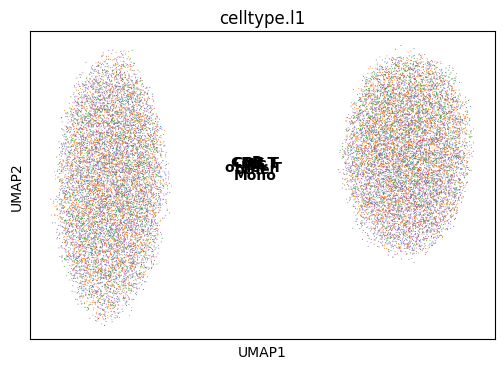

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


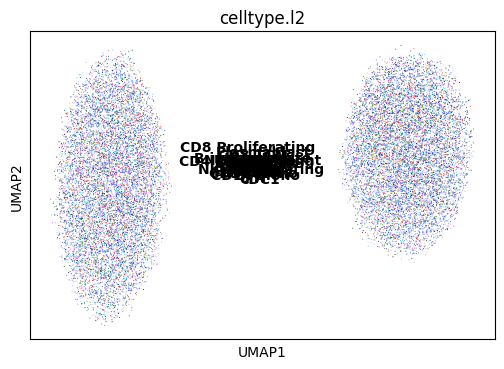

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


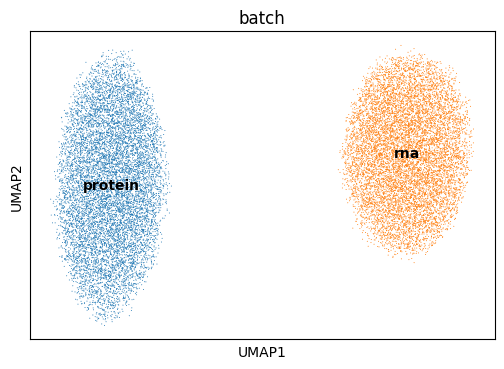

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


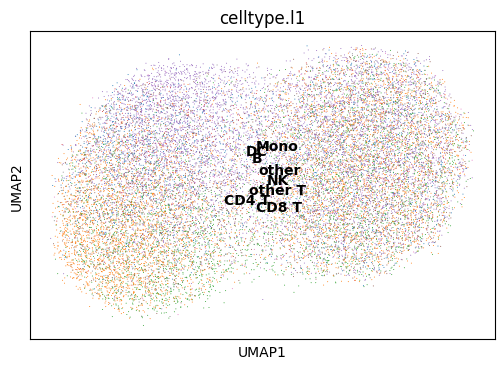

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


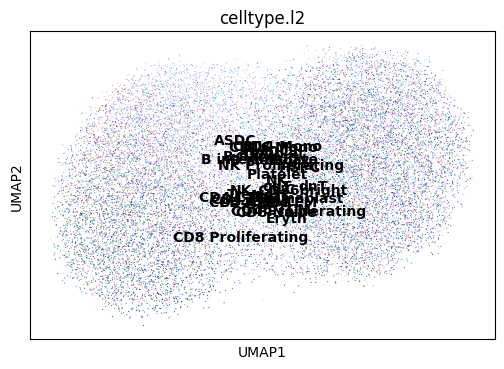

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


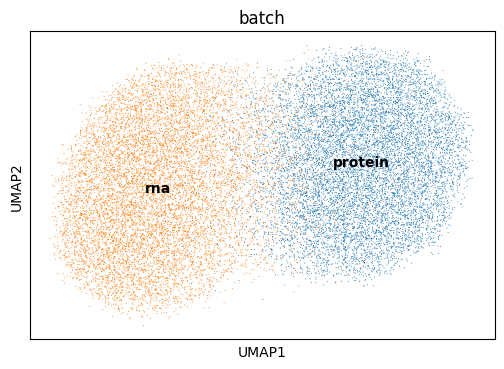

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.223,
lv2 matching acc: 0.135.
For All matchings: FOSCTTM score: 0.49313813, 
Knn Alignment score: [0.     0.     0.0001 0.0001 0.0002 0.0002 0.0004 0.0006 0.0007 0.001
 0.0016 0.0016 0.0018 0.0019 0.0021 0.0022 0.0023 0.0023 0.0024 0.0025
 0.0026 0.0028 0.003  0.0032 0.0032]
For All matchings: Silhouette F1 score for lv1: 0.4708403953630204, 
Silhouette F1 score for lv2: 0.46211890994722626



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.572821140289307
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.235,
lv2 matching acc: 0.152.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.220,
lv2 matching acc: 0.141.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


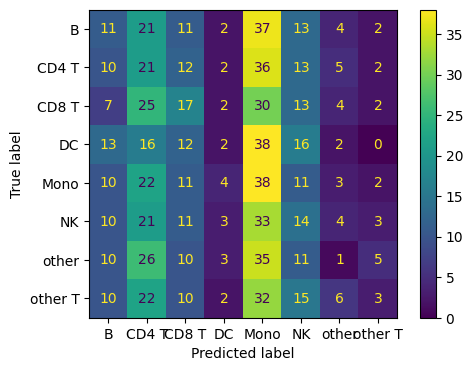

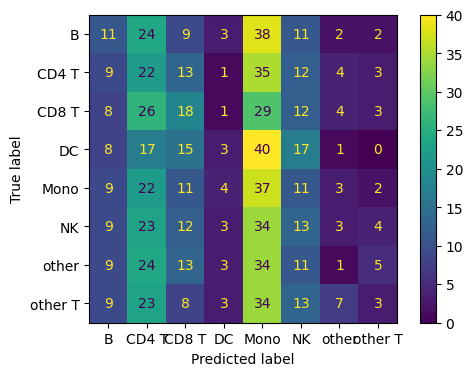

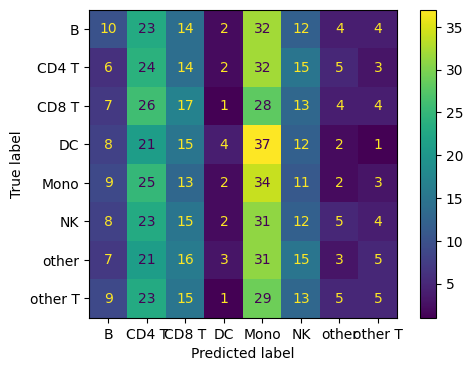

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.118,
lv2 matching acc: 0.077.
For All matchings: FOSCTTM score: 0.49671821, 
Knn Alignment score: [0.     0.0001 0.0002 0.0005 0.0005 0.0005 0.0007 0.0008 0.0011 0.0011
 0.0012 0.0013 0.0017 0.0018 0.0018 0.0018 0.0019 0.0019 0.0022 0.0023
 0.0025 0.0028 0.0029 0.0029 0.0031]
For All matchings: Silhouette F1 score for lv1: 0.38139888034164315, 
Silhouette F1 score for lv2: 0.37634971854161603



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  8.309484481811523
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.123,
lv2 matching acc: 0.079.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.171,
lv2 matching acc: 0.101.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


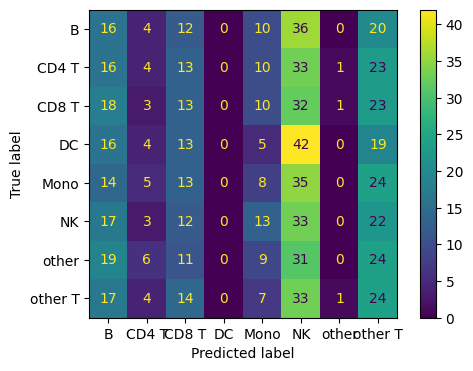

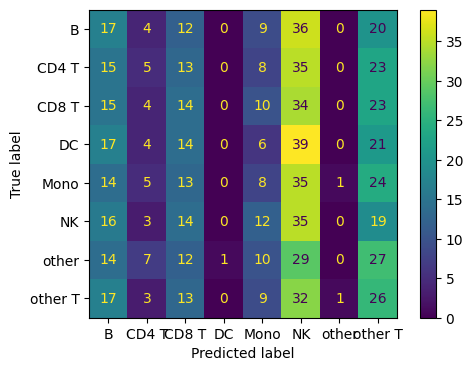

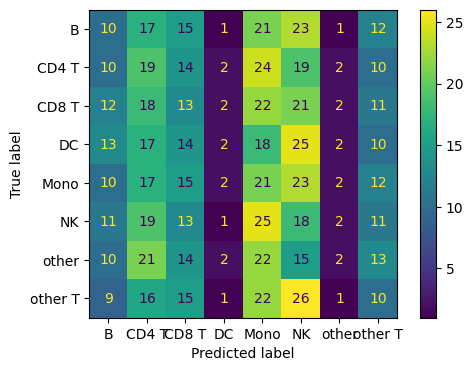

Epoch: 1: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 1: 40it [00:05,  7.20it/s]
Epoch: 2: 40it [00:05,  7.42it/s]
Epoch: 3: 40it [00:05,  7.70it/s]
Epoch: 4: 40it [00:05,  7.32it/s]
Epoch: 5: 40it [00:05,  7.61it/s]
Epoch: 6: 40it [00:05,  7.59it/s]
Epoch: 7: 40it [00:05,  7.52it/s]
Epoch: 8: 40it [00:05,  7.56it/s]
Epoch: 9: 40it [00:05,  7.51it/s]
Epoch: 10: 40it [00:05,  7.48it/s]
Epoch: 11: 40it [00:05,  7.45it/s]
Epoch: 12: 40it [00:05,  7.48it/s]
Epoch: 13: 40it [00:05,  7.50it/s]
Epoch: 1

Loss at iter 50 : 2399.907527923584


Epoch: 51: 40it [00:05,  7.29it/s]
Epoch: 52: 40it [00:05,  7.32it/s]
Epoch: 53: 40it [00:05,  7.19it/s]
Epoch: 54: 40it [00:05,  7.30it/s]
Epoch: 55: 40it [00:05,  7.17it/s]
Epoch: 56: 40it [00:05,  7.28it/s]
Epoch: 57: 40it [00:05,  7.20it/s]
Epoch: 58: 40it [00:05,  7.31it/s]
Epoch: 59: 40it [00:05,  7.30it/s]
Epoch: 60: 40it [00:05,  7.27it/s]
Epoch: 61: 40it [00:05,  7.31it/s]
Epoch: 62: 40it [00:05,  7.30it/s]
Epoch: 63: 40it [00:05,  7.31it/s]
Epoch: 64: 40it [00:05,  7.24it/s]
Epoch: 65: 40it [00:05,  7.18it/s]
Epoch: 66: 40it [00:05,  7.27it/s]
Epoch: 67: 40it [00:05,  7.32it/s]
Epoch: 68: 40it [00:05,  7.34it/s]
Epoch: 69: 40it [00:05,  7.30it/s]
Epoch: 70: 40it [00:05,  7.29it/s]
Epoch: 71: 40it [00:05,  7.32it/s]
Epoch: 72: 40it [00:05,  7.22it/s]
Epoch: 73: 40it [00:05,  7.31it/s]
Epoch: 74: 40it [00:05,  7.27it/s]
Epoch: 75: 40it [00:05,  7.24it/s]
Epoch: 76: 40it [00:05,  7.28it/s]
Epoch: 77: 40it [00:05,  7.26it/s]
Epoch: 78: 40it [00:05,  7.24it/s]
Epoch: 79: 40it [00:

Loss at iter 100 : 2138.458839416504


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


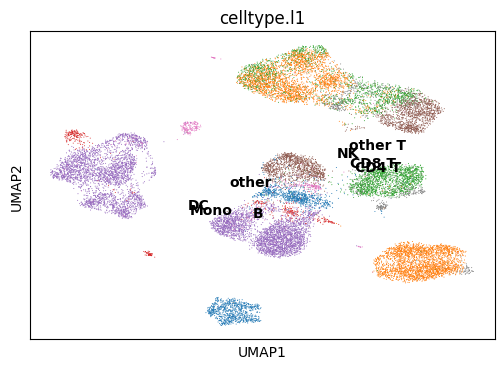

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


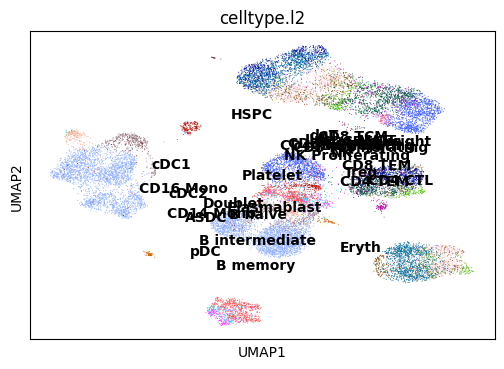

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


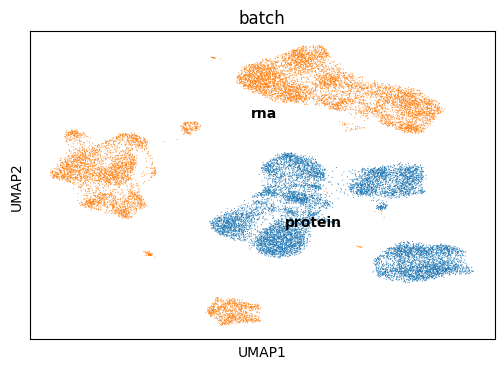

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


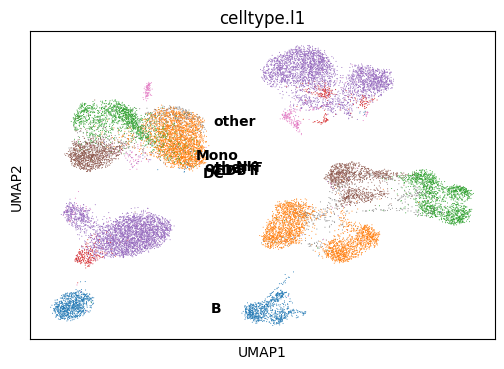

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


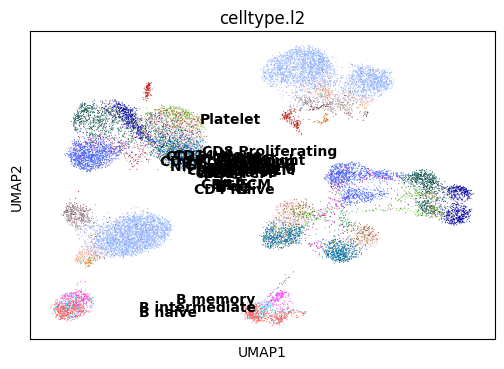

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


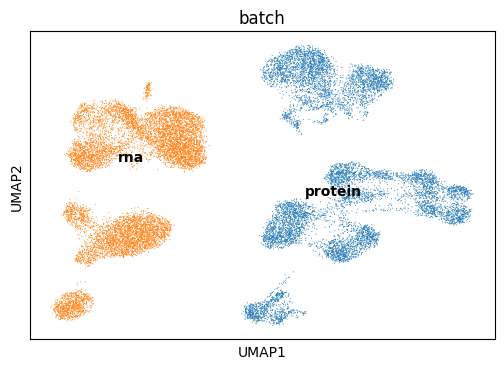

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.606,
lv2 matching acc: 0.344.
For All matchings: FOSCTTM score: 0.28466641, 
Knn Alignment score: [0.0006 0.0015 0.0022 0.0028 0.0036 0.0047 0.0056 0.0058 0.0067 0.007
 0.0081 0.0089 0.009  0.0093 0.0097 0.0103 0.0106 0.0112 0.0117 0.0125
 0.0131 0.014  0.0147 0.0148 0.0157]
For All matchings: Silhouette F1 score for lv1: 0.3936797480106084, 
Silhouette F1 score for lv2: 0.3833208413116359



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  7.107971668243408
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.629,
lv2 matching acc: 0.351.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.684,
lv2 matching acc: 0.444.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


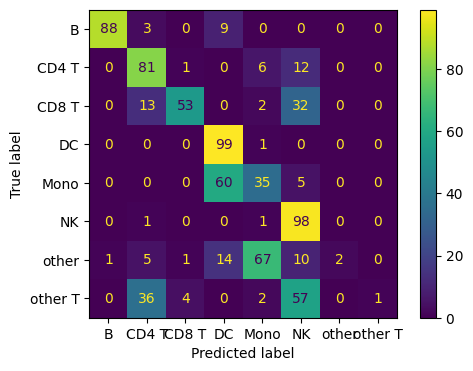

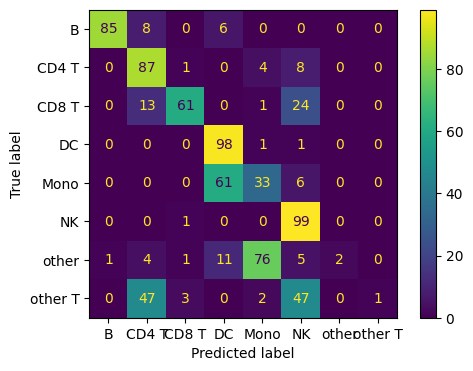

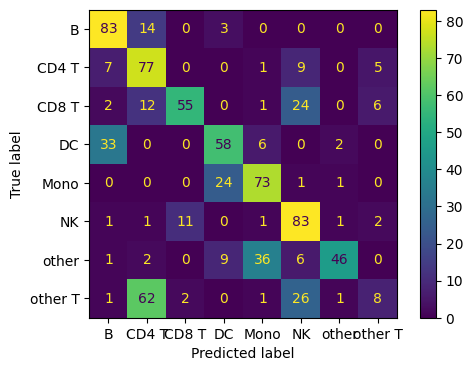

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.154,
lv2 matching acc: 0.095.
For All matchings: FOSCTTM score: 0.4659797500000001, 
Knn Alignment score: [0.0003 0.0004 0.0006 0.0006 0.0006 0.0008 0.001  0.001  0.0012 0.0016
 0.0019 0.0019 0.002  0.0023 0.0026 0.0027 0.0029 0.003  0.0031 0.0032
 0.0032 0.0032 0.0034 0.0035 0.0036]
For All matchings: Silhouette F1 score for lv1: 0.4245844332542543, 
Silhouette F1 score for lv2: 0.4097665802371318


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])





Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  6.474950551986694
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.215,
lv2 matching acc: 0.138.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.123,
lv2 matching acc: 0.043.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


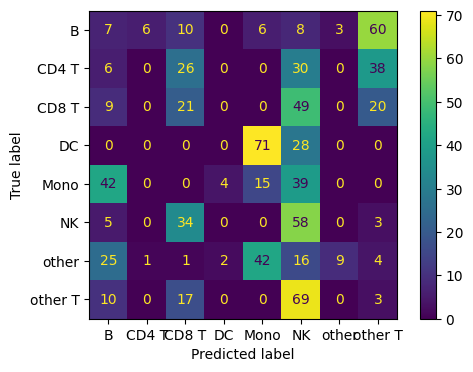

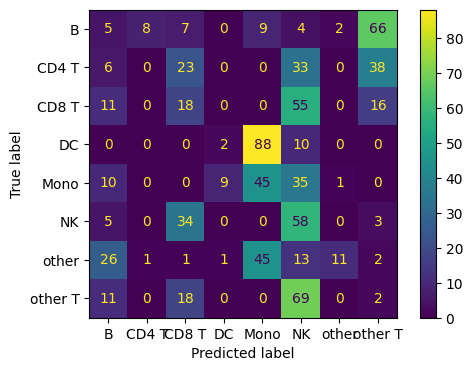

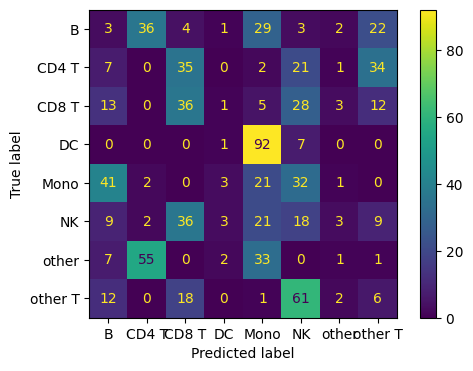

Epoch: 101: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 101: 40it [00:05,  7.46it/s]
Epoch: 102: 40it [00:05,  7.53it/s]
Epoch: 103: 40it [00:05,  7.50it/s]
Epoch: 104: 40it [00:05,  7.49it/s]
Epoch: 105: 40it [00:05,  7.50it/s]
Epoch: 106: 40it [00:05,  7.46it/s]
Epoch: 107: 40it [00:05,  7.47it/s]
Epoch: 108: 40it [00:05,  7.42it/s]
Epoch: 109: 40it [00:05,  7.36it/s]
Epoch: 110: 40it [00:05,  7.45it/s]
Epoch: 111: 40it [00:05,  7.38it/s]
Epoch: 112: 40it [00:05,  7.43it/s]
Epoch: 113: 40it [00

Loss at iter 150 : 1987.242389678955


Epoch: 151: 40it [00:05,  7.21it/s]
Epoch: 152: 40it [00:05,  7.30it/s]
Epoch: 153: 40it [00:05,  7.29it/s]
Epoch: 154: 40it [00:05,  7.25it/s]
Epoch: 155: 40it [00:05,  7.28it/s]
Epoch: 156: 40it [00:05,  7.20it/s]
Epoch: 157: 40it [00:05,  7.26it/s]
Epoch: 158: 40it [00:05,  7.20it/s]
Epoch: 159: 40it [00:05,  7.20it/s]
Epoch: 160: 40it [00:05,  7.35it/s]
Epoch: 161: 40it [00:05,  7.26it/s]
Epoch: 162: 40it [00:05,  7.24it/s]
Epoch: 163: 40it [00:05,  7.23it/s]
Epoch: 164: 40it [00:05,  7.22it/s]
Epoch: 165: 40it [00:05,  7.30it/s]
Epoch: 166: 40it [00:05,  7.23it/s]
Epoch: 167: 40it [00:05,  7.17it/s]
Epoch: 168: 40it [00:05,  7.30it/s]
Epoch: 169: 40it [00:05,  7.43it/s]
Epoch: 170: 40it [00:06,  6.67it/s]
Epoch: 171: 40it [00:07,  5.57it/s]
Epoch: 172: 40it [00:06,  6.37it/s]
Epoch: 173: 40it [00:06,  6.57it/s]
Epoch: 174: 40it [00:06,  6.58it/s]
Epoch: 175: 40it [00:06,  6.08it/s]
Epoch: 176: 40it [00:06,  6.57it/s]
Epoch: 177: 40it [00:05,  7.16it/s]
Epoch: 178: 40it [00:05,  7.

Loss at iter 200 : 1917.6609687805176


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


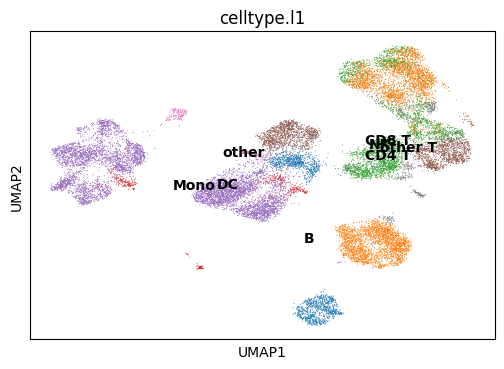

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


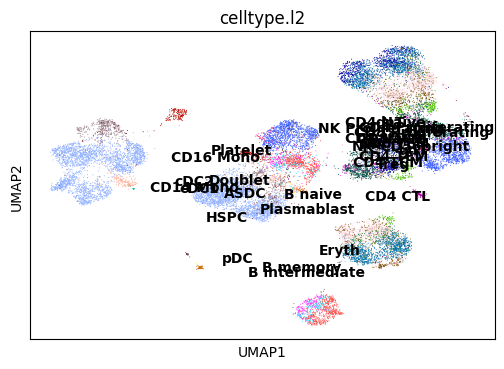

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


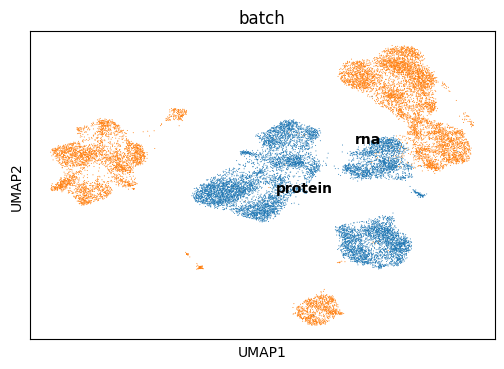

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


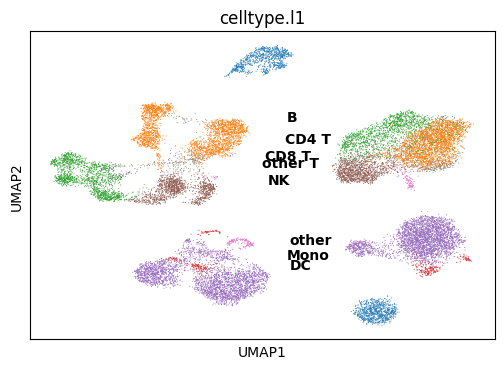

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


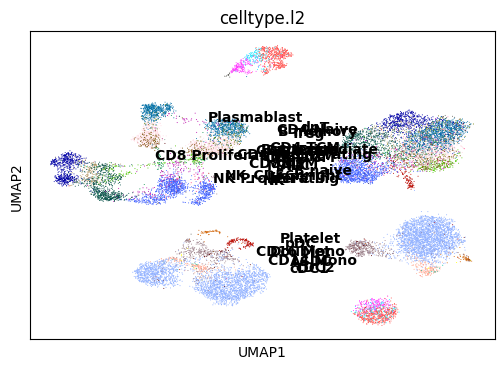

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


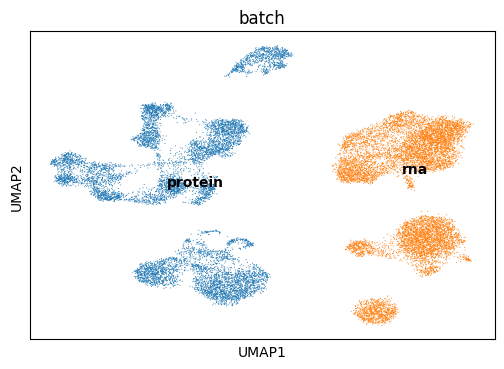

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.667,
lv2 matching acc: 0.447.
For All matchings: FOSCTTM score: 0.32279876999999996, 
Knn Alignment score: [0.0011 0.0025 0.0031 0.0038 0.0047 0.0051 0.0054 0.0063 0.007  0.0078
 0.0088 0.0095 0.0103 0.011  0.0118 0.0123 0.0127 0.0129 0.0134 0.0138
 0.0144 0.0149 0.0156 0.0164 0.0166]
For All matchings: Silhouette F1 score for lv1: 0.38349815128458487, 
Silhouette F1 score for lv2: 0.3767581817603669



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  7.343371152877808
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.728,
lv2 matching acc: 0.501.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.735,
lv2 matching acc: 0.492.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


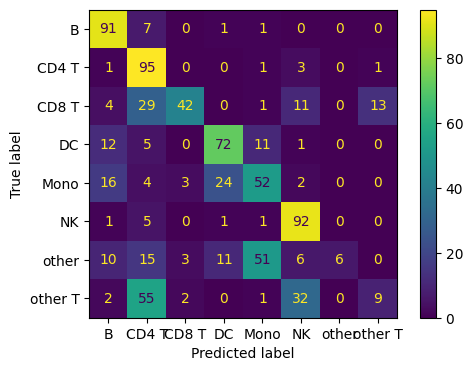

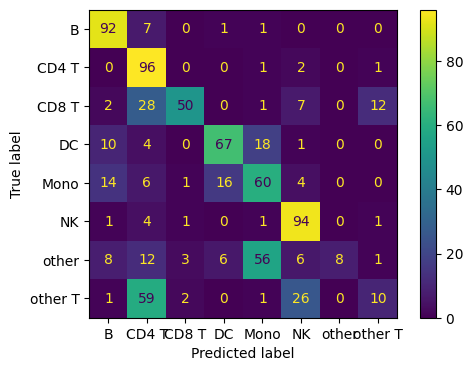

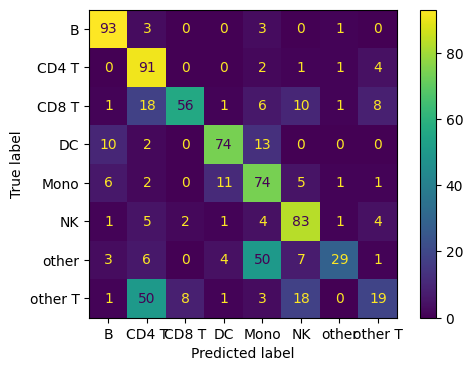

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.180,
lv2 matching acc: 0.077.
For All matchings: FOSCTTM score: 0.48964311, 
Knn Alignment score: [0.0001 0.0003 0.0004 0.0006 0.0006 0.0008 0.0009 0.0009 0.0011 0.0011
 0.0012 0.0013 0.0015 0.0015 0.0015 0.0016 0.0016 0.0016 0.0018 0.002
 0.0021 0.0022 0.0024 0.0024 0.0024]
For All matchings: Silhouette F1 score for lv1: 0.4782799805273411, 
Silhouette F1 score for lv2: 0.46206738221813004



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.058865308761597
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.203,
lv2 matching acc: 0.052.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.202,
lv2 matching acc: 0.090.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


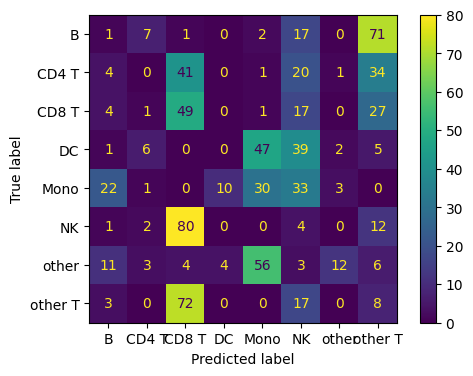

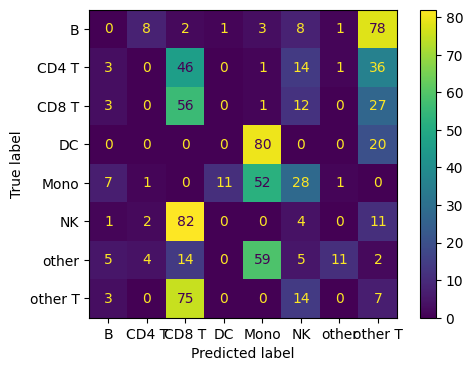

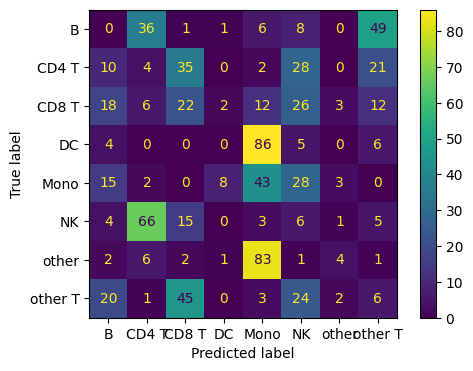

Epoch: 201: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 201: 40it [00:05,  7.45it/s]
Epoch: 202: 40it [00:05,  7.56it/s]
Epoch: 203: 40it [00:05,  7.54it/s]
Epoch: 204: 40it [00:05,  7.48it/s]
Epoch: 205: 40it [00:05,  7.49it/s]
Epoch: 206: 40it [00:05,  7.47it/s]
Epoch: 207: 40it [00:05,  7.43it/s]
Epoch: 208: 40it [00:05,  7.48it/s]
Epoch: 209: 40it [00:05,  7.39it/s]
Epoch: 210: 40it [00:05,  7.34it/s]
Epoch: 211: 40it [00:05,  7.40it/s]
Epoch: 212: 40it [00:05,  7.40it/s]
Epoch: 213: 40it [00

Loss at iter 250 : 1892.010555267334


Epoch: 251: 40it [00:06,  6.41it/s]
Epoch: 252: 40it [00:05,  6.80it/s]
Epoch: 253: 40it [00:06,  6.58it/s]
Epoch: 254: 40it [00:06,  6.39it/s]
Epoch: 255: 40it [00:06,  6.53it/s]
Epoch: 256: 40it [00:05,  7.07it/s]
Epoch: 257: 40it [00:05,  7.04it/s]
Epoch: 258: 40it [00:05,  7.08it/s]
Epoch: 259: 40it [00:05,  6.71it/s]
Epoch: 260: 40it [00:05,  7.12it/s]
Epoch: 261: 40it [00:06,  6.37it/s]
Epoch: 262: 40it [00:06,  6.63it/s]
Epoch: 263: 40it [00:06,  6.63it/s]
Epoch: 264: 40it [00:06,  6.27it/s]
Epoch: 265: 40it [00:06,  6.09it/s]
Epoch: 266: 40it [00:06,  6.46it/s]
Epoch: 267: 40it [00:06,  6.53it/s]
Epoch: 268: 40it [00:05,  6.84it/s]
Epoch: 269: 40it [00:05,  6.76it/s]
Epoch: 270: 40it [00:05,  6.92it/s]
Epoch: 271: 40it [00:06,  6.44it/s]
Epoch: 272: 40it [00:05,  7.17it/s]
Epoch: 273: 40it [00:06,  6.59it/s]
Epoch: 274: 40it [00:05,  6.73it/s]
Epoch: 275: 40it [00:05,  6.90it/s]
Epoch: 276: 40it [00:05,  6.88it/s]
Epoch: 277: 40it [00:06,  6.26it/s]
Epoch: 278: 40it [00:06,  6.

Loss at iter 300 : 1859.0732917785645


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


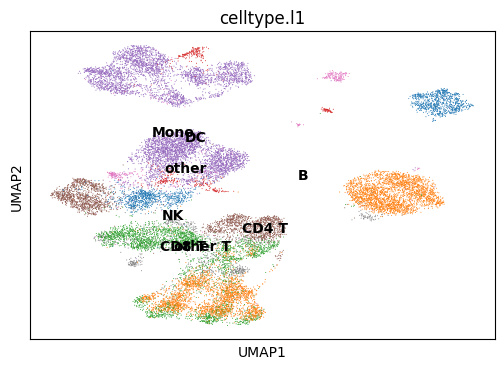

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


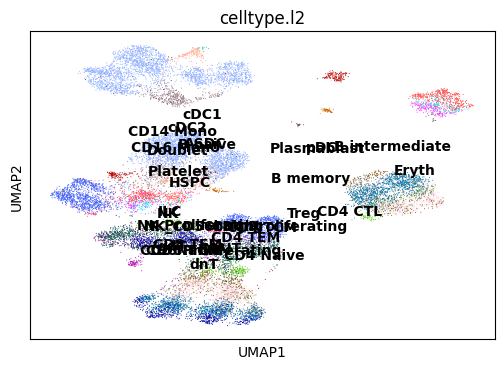

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


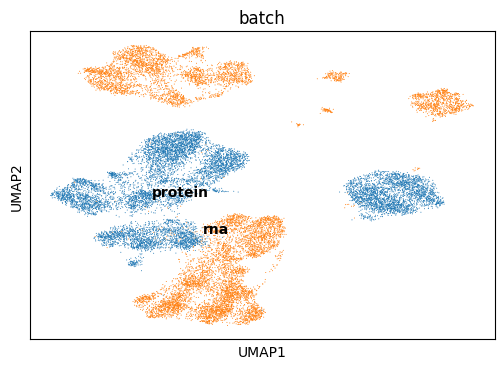

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


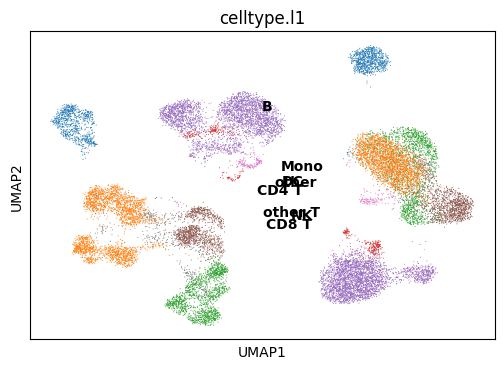

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


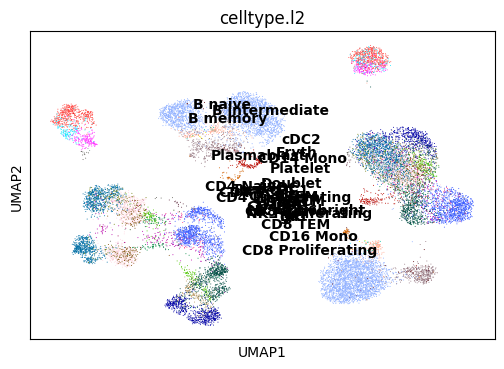

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


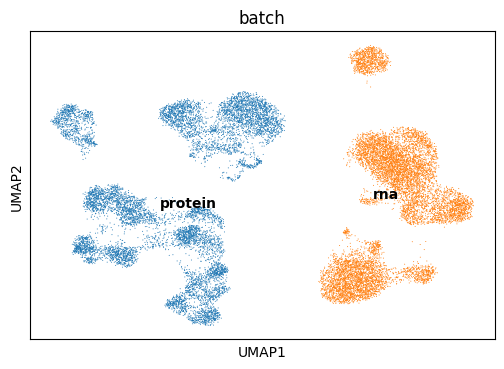

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.552,
lv2 matching acc: 0.309.
For All matchings: FOSCTTM score: 0.33697097000000004, 
Knn Alignment score: [0.0008 0.0014 0.0022 0.0026 0.0038 0.0043 0.0049 0.0058 0.0063 0.0072
 0.008  0.0087 0.0094 0.01   0.0106 0.0112 0.0118 0.0123 0.013  0.0133
 0.0138 0.0141 0.0145 0.0149 0.0152]
For All matchings: Silhouette F1 score for lv1: 0.3843298906974146, 
Silhouette F1 score for lv2: 0.3783281246648423



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  6.66981840133667
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.630,
lv2 matching acc: 0.321.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.626,
lv2 matching acc: 0.429.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


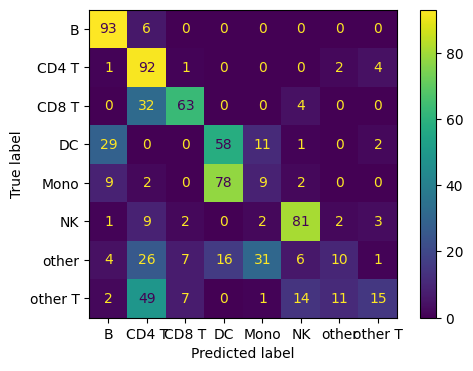

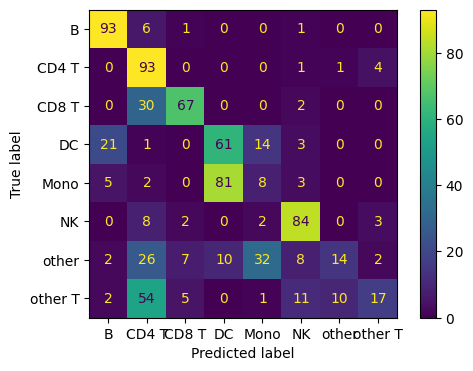

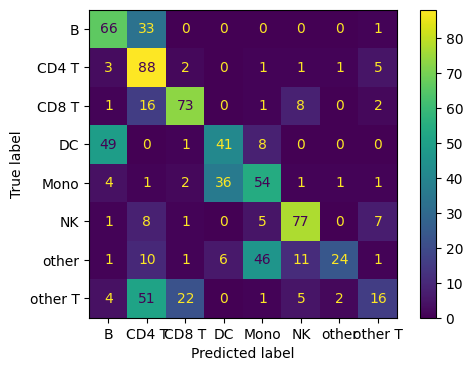

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.263,
lv2 matching acc: 0.146.
For All matchings: FOSCTTM score: 0.48583127000000004, 
Knn Alignment score: [0.0002 0.0005 0.0005 0.0006 0.0007 0.0007 0.0007 0.0008 0.0008 0.0008
 0.0009 0.001  0.0011 0.0014 0.0016 0.0017 0.0019 0.0022 0.0024 0.0024
 0.0024 0.0024 0.0024 0.0025 0.0027]
For All matchings: Silhouette F1 score for lv1: 0.4908731393754635, 
Silhouette F1 score for lv2: 0.47208930159960216



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.575278997421265
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.261,
lv2 matching acc: 0.101.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.279,
lv2 matching acc: 0.148.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


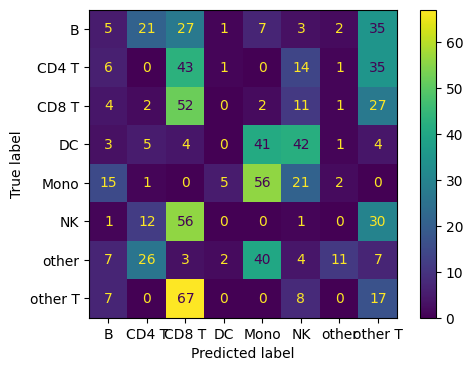

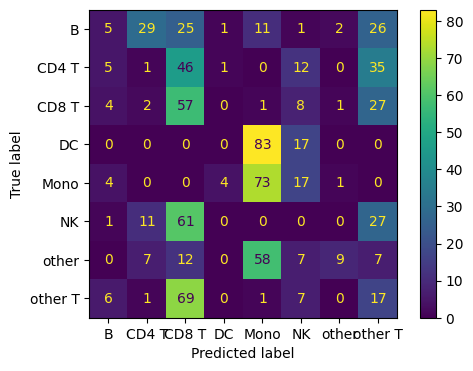

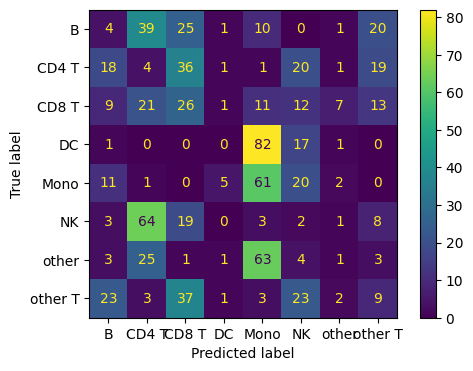

Epoch: 301: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 301: 40it [00:06,  6.33it/s]
Epoch: 302: 40it [00:05,  6.95it/s]
Epoch: 303: 40it [00:05,  6.97it/s]
Epoch: 304: 40it [00:06,  6.48it/s]
Epoch: 305: 40it [00:05,  6.69it/s]
Epoch: 306: 40it [00:06,  6.00it/s]
Epoch: 307: 40it [00:06,  6.55it/s]
Epoch: 308: 40it [00:05,  6.76it/s]
Epoch: 309: 40it [00:05,  6.71it/s]
Epoch: 310: 40it [00:06,  6.44it/s]
Epoch: 311: 40it [00:05,  6.78it/s]
Epoch: 312: 40it [00:06,  5.93it/s]
Epoch: 313: 40it [00

Loss at iter 350 : 1856.583667755127


Epoch: 351: 40it [00:05,  7.35it/s]
Epoch: 352: 40it [00:05,  7.38it/s]
Epoch: 353: 40it [00:05,  7.34it/s]
Epoch: 354: 40it [00:05,  7.27it/s]
Epoch: 355: 40it [00:05,  7.36it/s]
Epoch: 356: 40it [00:05,  7.07it/s]
Epoch: 357: 40it [00:05,  7.21it/s]
Epoch: 358: 40it [00:05,  7.24it/s]
Epoch: 359: 40it [00:05,  7.17it/s]
Epoch: 360: 40it [00:05,  7.38it/s]
Epoch: 361: 40it [00:05,  7.28it/s]
Epoch: 362: 40it [00:05,  7.38it/s]
Epoch: 363: 40it [00:05,  7.33it/s]
Epoch: 364: 40it [00:05,  7.34it/s]
Epoch: 365: 40it [00:05,  7.31it/s]
Epoch: 366: 40it [00:05,  7.35it/s]
Epoch: 367: 40it [00:05,  7.29it/s]
Epoch: 368: 40it [00:05,  7.46it/s]
Epoch: 369: 40it [00:05,  7.46it/s]
Epoch: 370: 40it [00:05,  7.41it/s]
Epoch: 371: 40it [00:05,  7.47it/s]
Epoch: 372: 40it [00:05,  7.37it/s]
Epoch: 373: 40it [00:05,  7.45it/s]
Epoch: 374: 40it [00:05,  7.47it/s]
Epoch: 375: 40it [00:05,  7.45it/s]
Epoch: 376: 40it [00:05,  7.51it/s]
Epoch: 377: 40it [00:05,  7.38it/s]
Epoch: 378: 40it [00:05,  7.

Loss at iter 400 : 1832.4812202453613


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


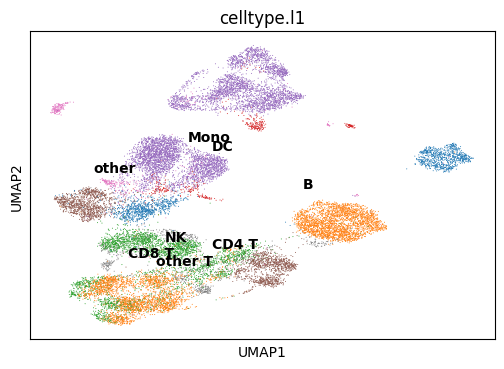

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


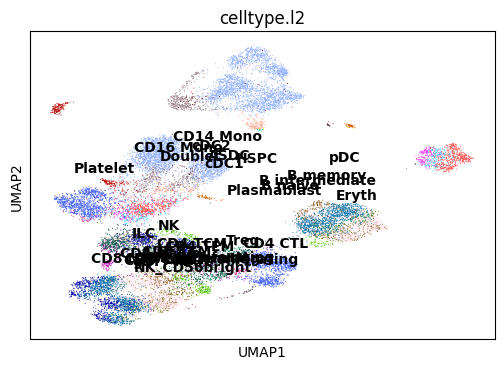

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


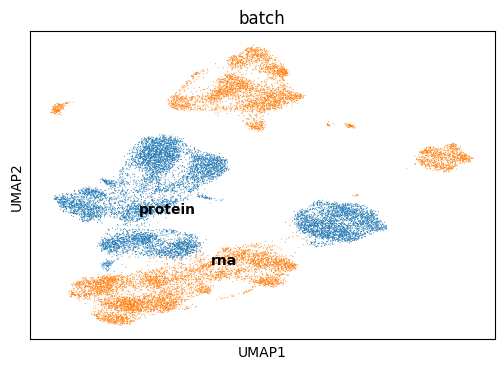

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


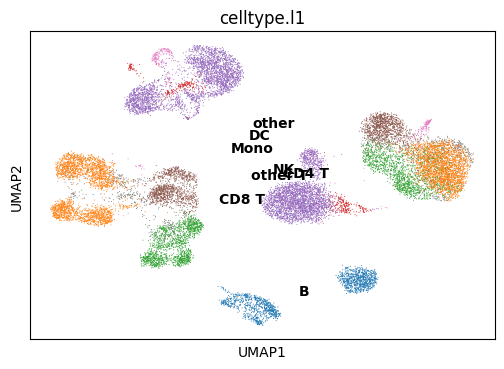

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


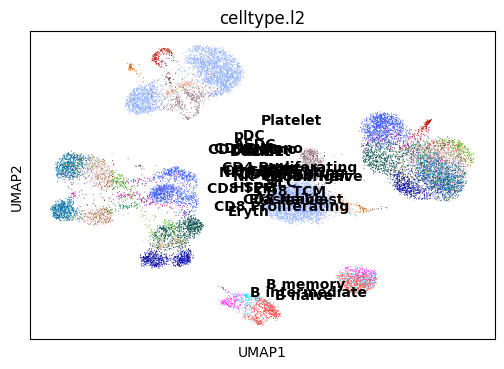

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


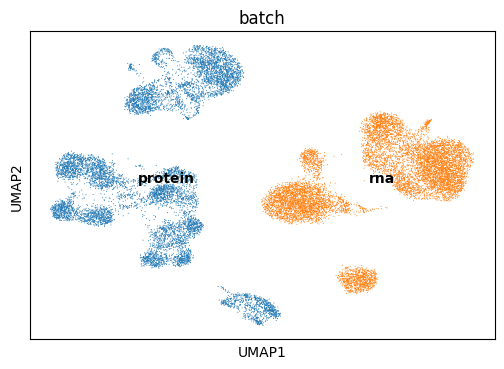

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.553,
lv2 matching acc: 0.340.
For All matchings: FOSCTTM score: 0.32942008, 
Knn Alignment score: [0.0012 0.002  0.0024 0.0031 0.0036 0.0049 0.0059 0.0066 0.0073 0.0085
 0.0095 0.0098 0.0108 0.0117 0.0123 0.0129 0.0138 0.0143 0.015  0.0154
 0.0158 0.016  0.0169 0.0174 0.0178]
For All matchings: Silhouette F1 score for lv1: 0.3900980202191047, 
Silhouette F1 score for lv2: 0.38376656060627745


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])





Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.879543304443359
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.638,
lv2 matching acc: 0.380.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.610,
lv2 matching acc: 0.426.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


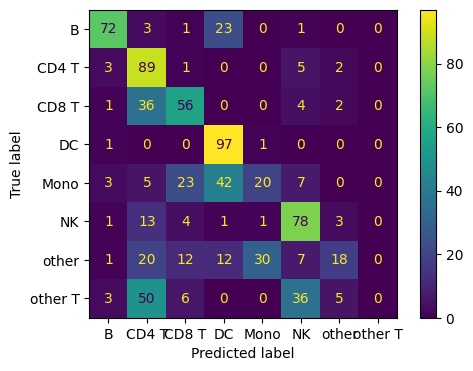

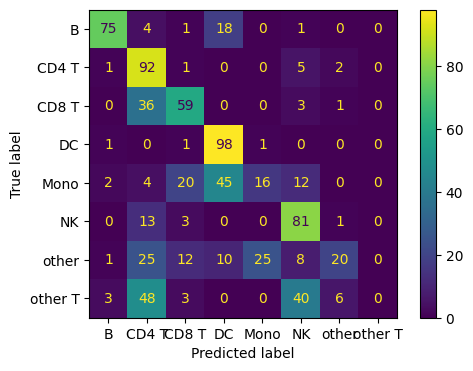

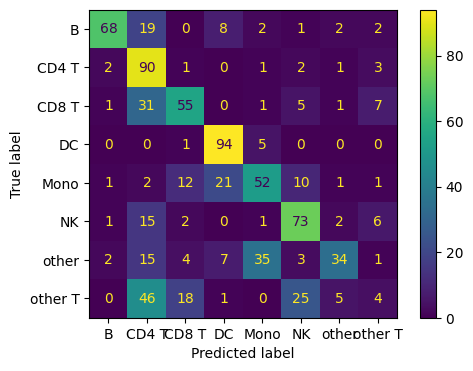

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.287,
lv2 matching acc: 0.175.
For All matchings: FOSCTTM score: 0.45399661999999996, 
Knn Alignment score: [0.     0.     0.0001 0.0001 0.0001 0.0001 0.0002 0.0003 0.0006 0.0008
 0.0008 0.0012 0.0014 0.0015 0.0015 0.0017 0.0019 0.0022 0.0024 0.0024
 0.0025 0.0025 0.0028 0.003  0.0032]
For All matchings: Silhouette F1 score for lv1: 0.4939535624724436, 
Silhouette F1 score for lv2: 0.47482556638663004



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.097849130630493
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.265,
lv2 matching acc: 0.139.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.305,
lv2 matching acc: 0.177.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


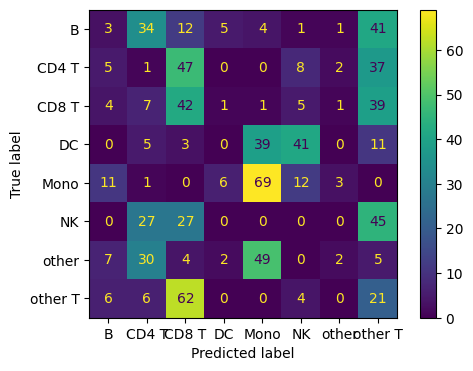

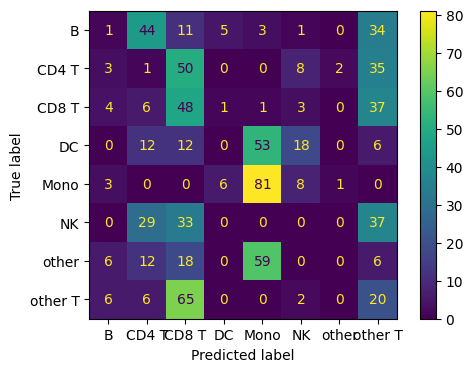

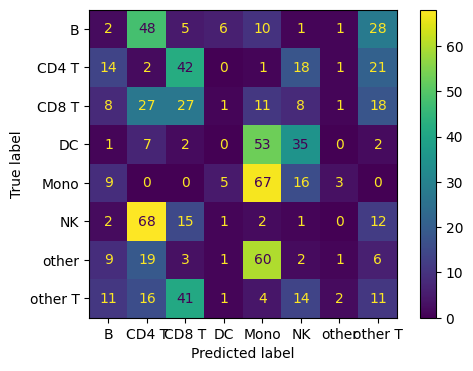

Epoch: 401: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 401: 40it [00:06,  5.95it/s]
Epoch: 402: 40it [00:06,  6.37it/s]
Epoch: 403: 40it [00:05,  6.98it/s]
Epoch: 404: 40it [00:05,  7.28it/s]
Epoch: 405: 40it [00:05,  6.96it/s]
Epoch: 406: 40it [00:05,  6.80it/s]
Epoch: 407: 40it [00:05,  7.16it/s]
Epoch: 408: 40it [00:05,  7.39it/s]
Epoch: 409: 40it [00:05,  7.46it/s]
Epoch: 410: 40it [00:05,  7.40it/s]
Epoch: 411: 40it [00:05,  7.28it/s]
Epoch: 412: 40it [00:05,  7.07it/s]
Epoch: 413: 40it [00

Loss at iter 450 : 1834.1376266479492


Epoch: 451: 40it [00:05,  7.34it/s]
Epoch: 452: 40it [00:05,  7.27it/s]
Epoch: 453: 40it [00:05,  7.33it/s]
Epoch: 454: 40it [00:05,  7.35it/s]
Epoch: 455: 40it [00:05,  7.31it/s]
Epoch: 456: 40it [00:05,  7.30it/s]
Epoch: 457: 40it [00:05,  7.34it/s]
Epoch: 458: 40it [00:05,  7.33it/s]
Epoch: 459: 40it [00:05,  7.23it/s]
Epoch: 460: 40it [00:05,  7.33it/s]
Epoch: 461: 40it [00:05,  7.36it/s]
Epoch: 462: 40it [00:05,  7.12it/s]
Epoch: 463: 40it [00:05,  7.36it/s]
Epoch: 464: 40it [00:05,  7.39it/s]
Epoch: 465: 40it [00:05,  7.31it/s]
Epoch: 466: 40it [00:05,  7.38it/s]
Epoch: 467: 40it [00:05,  7.37it/s]
Epoch: 468: 40it [00:05,  7.32it/s]
Epoch: 469: 40it [00:05,  7.34it/s]
Epoch: 470: 40it [00:05,  7.35it/s]
Epoch: 471: 40it [00:05,  7.34it/s]
Epoch: 472: 40it [00:05,  7.39it/s]
Epoch: 473: 40it [00:05,  7.27it/s]
Epoch: 474: 40it [00:05,  7.21it/s]
Epoch: 475: 40it [00:05,  7.24it/s]
Epoch: 476: 40it [00:05,  7.15it/s]
Epoch: 477: 40it [00:05,  7.40it/s]
Epoch: 478: 40it [00:05,  7.

Loss at iter 500 : 1822.4265975952148


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


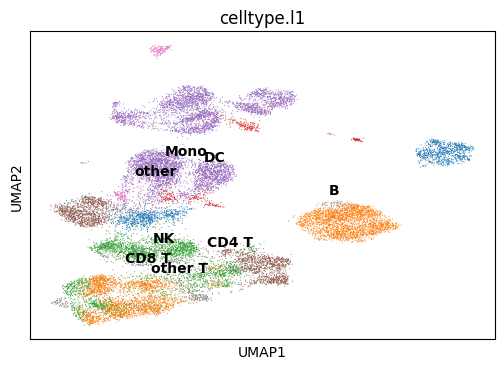

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


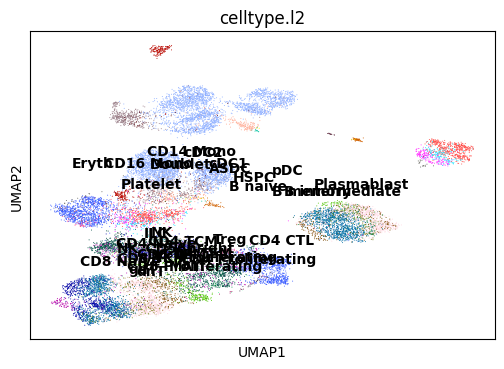

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


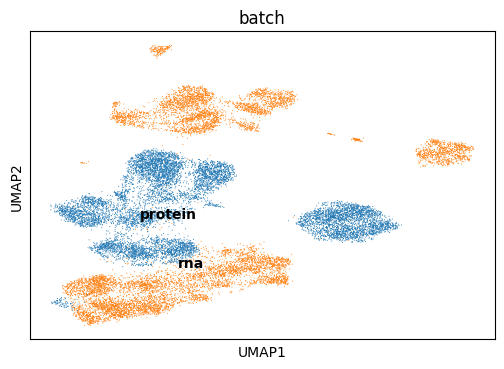

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


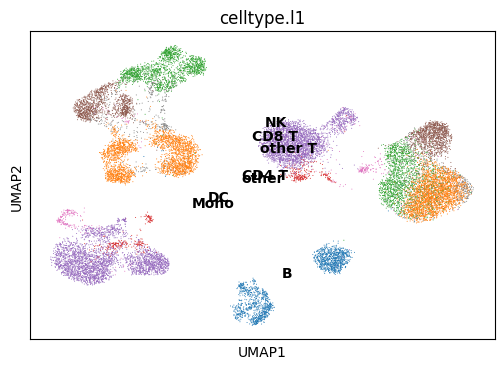

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


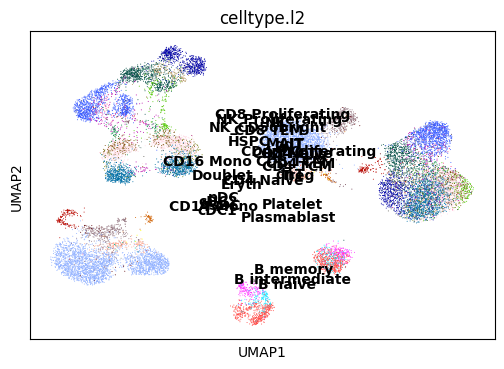

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


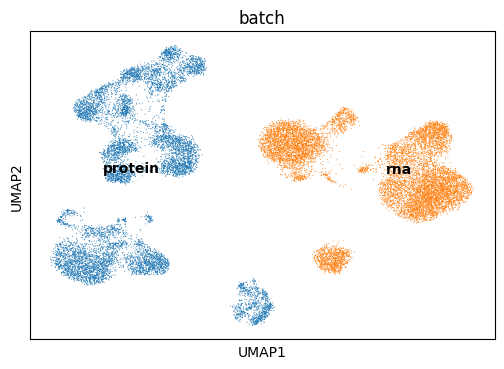

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.568,
lv2 matching acc: 0.374.
For All matchings: FOSCTTM score: 0.34658835000000005, 
Knn Alignment score: [0.001  0.002  0.0027 0.003  0.0042 0.005  0.0061 0.007  0.0079 0.0082
 0.0086 0.0095 0.0105 0.0112 0.0117 0.0125 0.013  0.0133 0.0138 0.0144
 0.0155 0.016  0.0169 0.0175 0.0177]
For All matchings: Silhouette F1 score for lv1: 0.3926299862747429, 
Silhouette F1 score for lv2: 0.3863764548046963


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])





Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.688076019287109
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.564,
lv2 matching acc: 0.294.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.633,
lv2 matching acc: 0.474.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


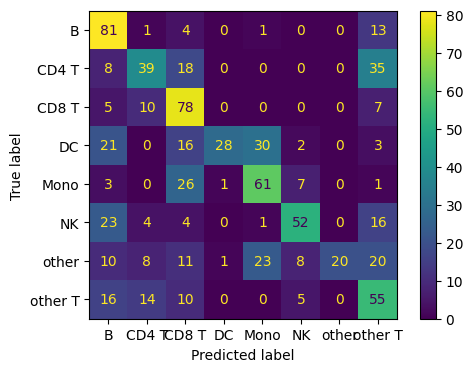

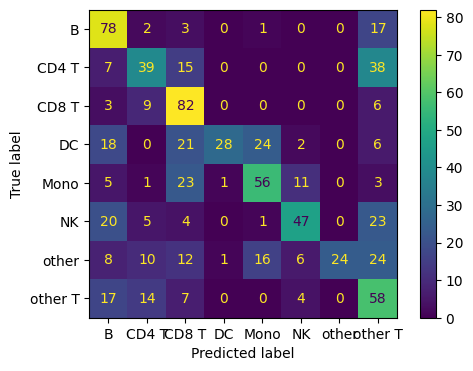

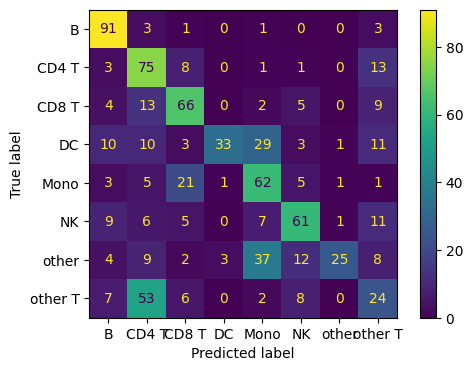

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.320,
lv2 matching acc: 0.216.
For All matchings: FOSCTTM score: 0.43566777, 
Knn Alignment score: [0.0003 0.0005 0.0006 0.0006 0.0007 0.0008 0.0009 0.0011 0.0011 0.0013
 0.0015 0.0017 0.002  0.0021 0.0021 0.0023 0.0024 0.0026 0.0028 0.0028
 0.0029 0.0031 0.0031 0.0032 0.0036]
For All matchings: Silhouette F1 score for lv1: 0.4950098738657855, 
Silhouette F1 score for lv2: 0.47612017983158095



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.7326077222824097
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.284,
lv2 matching acc: 0.177.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.340,
lv2 matching acc: 0.225.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


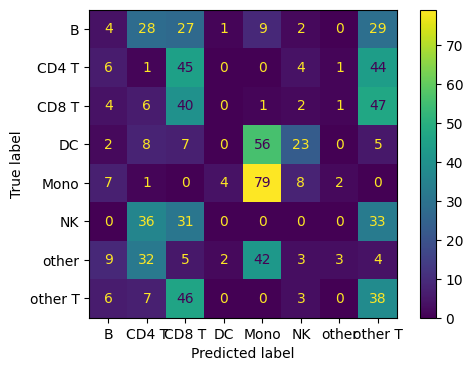

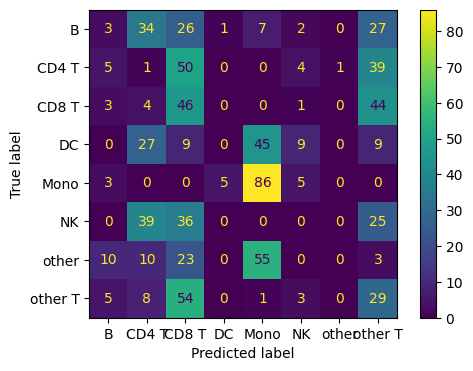

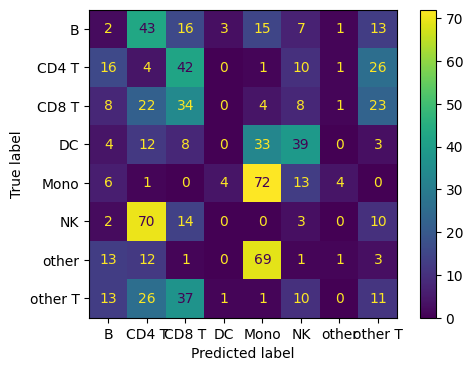

Epoch: 501: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 501: 40it [00:05,  7.63it/s]
Epoch: 502: 40it [00:05,  7.75it/s]
Epoch: 503: 40it [00:05,  7.76it/s]
Epoch: 504: 40it [00:05,  7.69it/s]
Epoch: 505: 40it [00:05,  7.72it/s]
Epoch: 506: 40it [00:05,  7.67it/s]
Epoch: 507: 40it [00:05,  7.64it/s]
Epoch: 508: 40it [00:05,  7.62it/s]
Epoch: 509: 40it [00:05,  7.59it/s]
Epoch: 510: 40it [00:05,  7.68it/s]
Epoch: 511: 40it [00:05,  7.54it/s]
Epoch: 512: 40it [00:05,  7.57it/s]
Epoch: 513: 40it [00

Loss at iter 550 : 1810.4023208618164


Epoch: 551: 40it [00:05,  7.45it/s]
Epoch: 552: 40it [00:05,  7.50it/s]
Epoch: 553: 40it [00:05,  7.44it/s]
Epoch: 554: 40it [00:05,  6.97it/s]
Epoch: 555: 40it [00:05,  7.12it/s]
Epoch: 556: 40it [00:05,  7.48it/s]
Epoch: 557: 40it [00:05,  7.06it/s]
Epoch: 558: 40it [00:06,  6.37it/s]
Epoch: 559: 40it [00:05,  7.10it/s]
Epoch: 560: 40it [00:06,  6.59it/s]
Epoch: 561: 40it [00:06,  6.60it/s]
Epoch: 562: 40it [00:05,  7.00it/s]
Epoch: 563: 40it [00:05,  6.87it/s]
Epoch: 564: 40it [00:05,  6.83it/s]
Epoch: 565: 40it [00:05,  6.81it/s]
Epoch: 566: 40it [00:06,  6.10it/s]
Epoch: 567: 40it [00:05,  7.23it/s]
Epoch: 568: 40it [00:05,  7.01it/s]
Epoch: 569: 40it [00:05,  6.95it/s]
Epoch: 570: 40it [00:05,  6.89it/s]
Epoch: 571: 40it [00:05,  6.95it/s]
Epoch: 572: 40it [00:05,  6.78it/s]
Epoch: 573: 40it [00:05,  7.10it/s]
Epoch: 574: 40it [00:05,  7.14it/s]
Epoch: 575: 40it [00:05,  7.15it/s]
Epoch: 576: 40it [00:05,  7.14it/s]
Epoch: 577: 40it [00:05,  7.14it/s]
Epoch: 578: 40it [00:05,  7.

Loss at iter 600 : 1805.927433013916


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


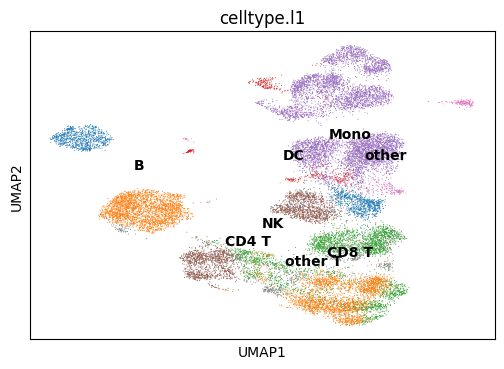

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


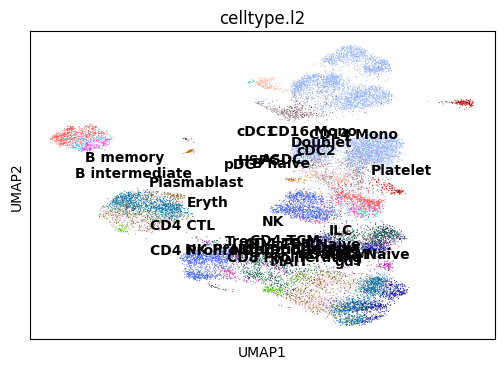

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


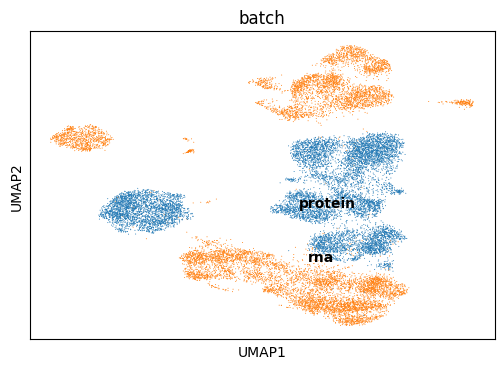

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


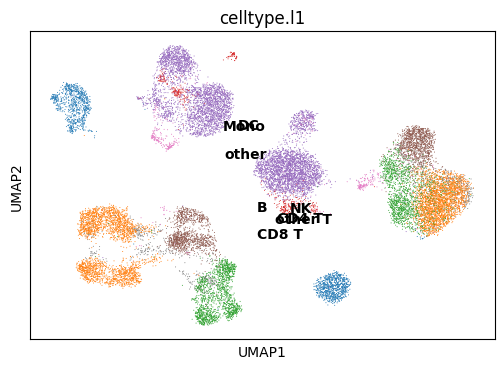

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


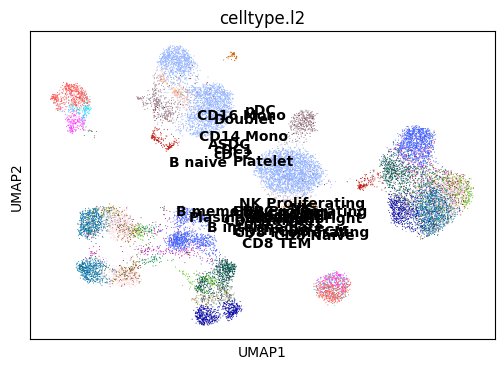

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


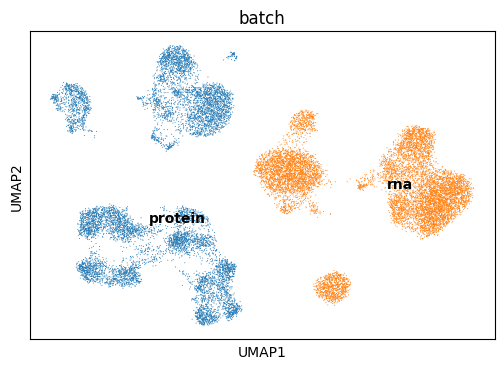

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.576,
lv2 matching acc: 0.381.
For All matchings: FOSCTTM score: 0.33003226, 
Knn Alignment score: [0.0011 0.0021 0.0029 0.0038 0.0044 0.005  0.0058 0.007  0.0073 0.0083
 0.0092 0.0097 0.0104 0.0109 0.0114 0.0117 0.0122 0.0126 0.0134 0.014
 0.0146 0.0152 0.0157 0.0161 0.0165]
For All matchings: Silhouette F1 score for lv1: 0.39628414404492923, 
Silhouette F1 score for lv2: 0.3901075326075088



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.386915445327759
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.657,
lv2 matching acc: 0.405.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])





Matches are being propagated....


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.559,
lv2 matching acc: 0.404.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


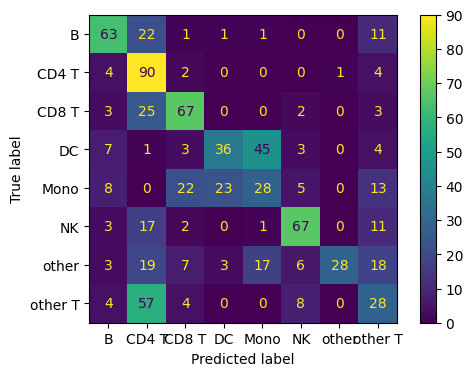

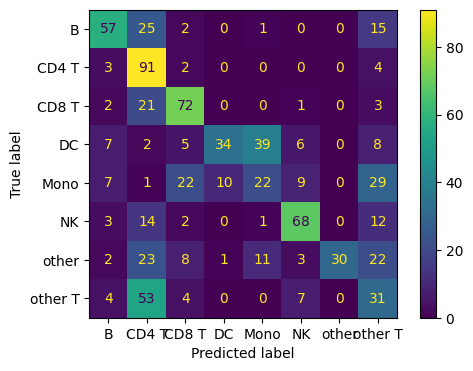

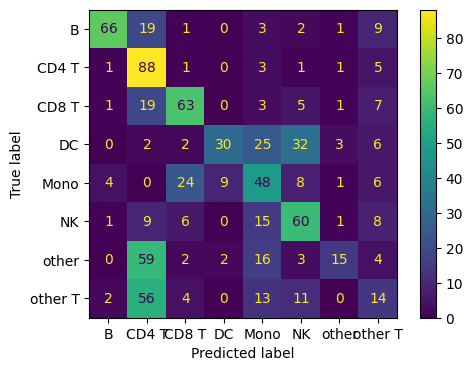

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.334,
lv2 matching acc: 0.242.
For All matchings: FOSCTTM score: 0.40982271, 
Knn Alignment score: [0.0002 0.0003 0.0003 0.0003 0.0004 0.0005 0.0005 0.0005 0.0008 0.0009
 0.001  0.0012 0.0017 0.0021 0.0021 0.0021 0.0022 0.0025 0.0027 0.0031
 0.0032 0.0033 0.0037 0.0037 0.0038]
For All matchings: Silhouette F1 score for lv1: 0.49395376359506826, 
Silhouette F1 score for lv2: 0.47668150697869893



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.4193103313446045
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.315,
lv2 matching acc: 0.224.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.348,
lv2 matching acc: 0.229.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


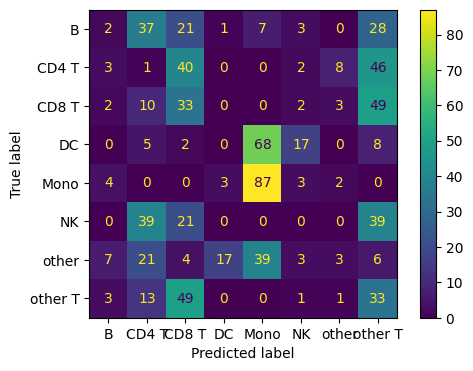

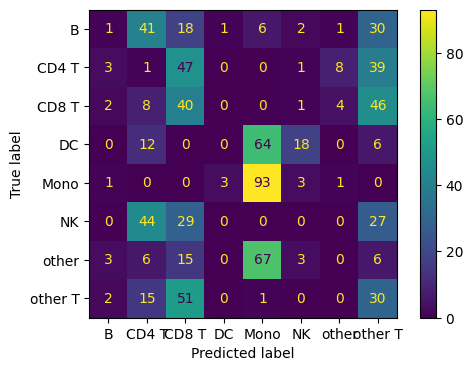

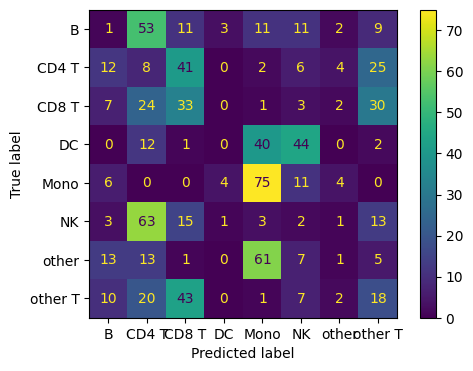

Epoch: 601: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 601: 40it [00:05,  7.39it/s]
Epoch: 602: 40it [00:05,  7.39it/s]
Epoch: 603: 40it [00:05,  7.33it/s]
Epoch: 604: 40it [00:05,  7.51it/s]
Epoch: 605: 40it [00:05,  7.42it/s]
Epoch: 606: 40it [00:05,  7.47it/s]
Epoch: 607: 40it [00:05,  7.22it/s]
Epoch: 608: 40it [00:05,  7.36it/s]
Epoch: 609: 40it [00:05,  7.33it/s]
Epoch: 610: 40it [00:05,  7.39it/s]
Epoch: 611: 40it [00:05,  7.32it/s]
Epoch: 612: 40it [00:05,  7.16it/s]
Epoch: 613: 40it [00

Loss at iter 650 : 1799.2160301208496


Epoch: 651: 40it [00:05,  7.17it/s]
Epoch: 652: 40it [00:05,  7.24it/s]
Epoch: 653: 40it [00:05,  7.19it/s]
Epoch: 654: 40it [00:05,  7.15it/s]
Epoch: 655: 40it [00:05,  7.19it/s]
Epoch: 656: 40it [00:05,  7.19it/s]
Epoch: 657: 40it [00:05,  7.21it/s]
Epoch: 658: 40it [00:05,  7.17it/s]
Epoch: 659: 40it [00:05,  7.14it/s]
Epoch: 660: 40it [00:05,  7.24it/s]
Epoch: 661: 40it [00:05,  7.18it/s]
Epoch: 662: 40it [00:05,  7.14it/s]
Epoch: 663: 40it [00:05,  7.15it/s]
Epoch: 664: 40it [00:05,  7.16it/s]
Epoch: 665: 40it [00:05,  7.17it/s]
Epoch: 666: 40it [00:05,  7.16it/s]
Epoch: 667: 40it [00:05,  7.11it/s]
Epoch: 668: 40it [00:05,  7.10it/s]
Epoch: 669: 40it [00:05,  7.11it/s]
Epoch: 670: 40it [00:05,  6.99it/s]
Epoch: 671: 40it [00:05,  7.15it/s]
Epoch: 672: 40it [00:05,  7.15it/s]
Epoch: 673: 40it [00:05,  7.11it/s]
Epoch: 674: 40it [00:05,  7.19it/s]
Epoch: 675: 40it [00:05,  7.19it/s]
Epoch: 676: 40it [00:05,  7.18it/s]
Epoch: 677: 40it [00:05,  7.21it/s]
Epoch: 678: 40it [00:05,  7.

Loss at iter 700 : 1795.9782752990723


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


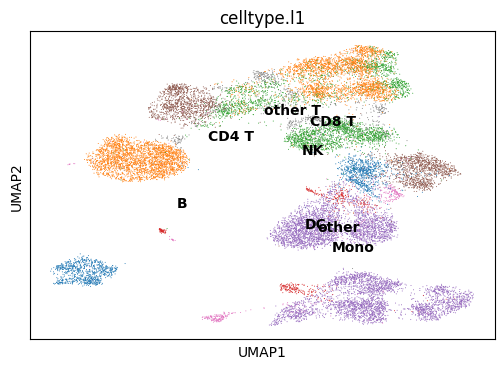

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


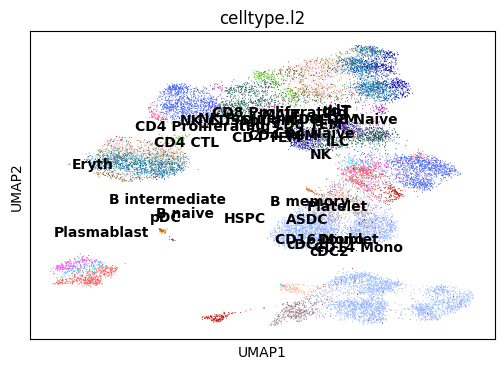

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


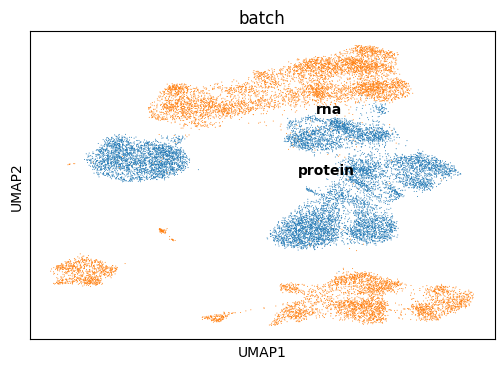

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


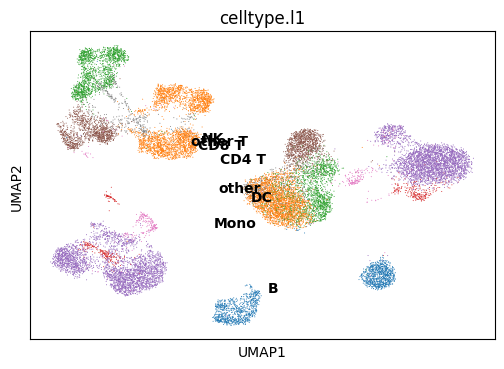

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


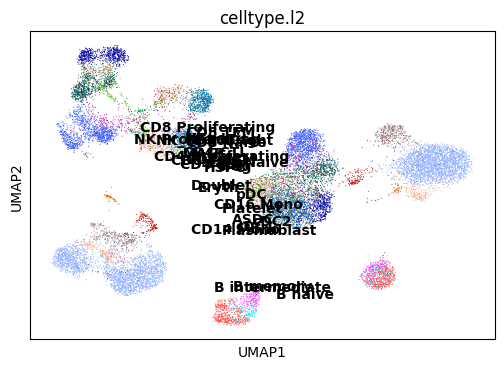

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


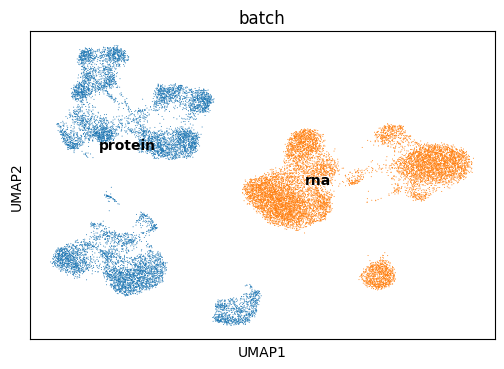

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.497,
lv2 matching acc: 0.307.
For All matchings: FOSCTTM score: 0.31278764, 
Knn Alignment score: [0.0015 0.0025 0.0033 0.0036 0.004  0.0042 0.0048 0.0053 0.0059 0.0066
 0.0071 0.0079 0.0086 0.0097 0.01   0.0106 0.0113 0.0119 0.0125 0.013
 0.0137 0.0139 0.0148 0.0153 0.0161]
For All matchings: Silhouette F1 score for lv1: 0.40604625368962405, 
Silhouette F1 score for lv2: 0.3989365250114809



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.982269048690796
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.574,
lv2 matching acc: 0.316.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.532,
lv2 matching acc: 0.398.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


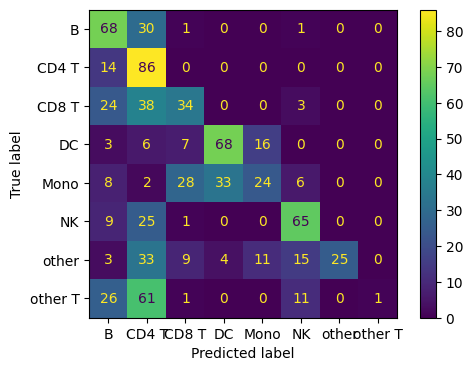

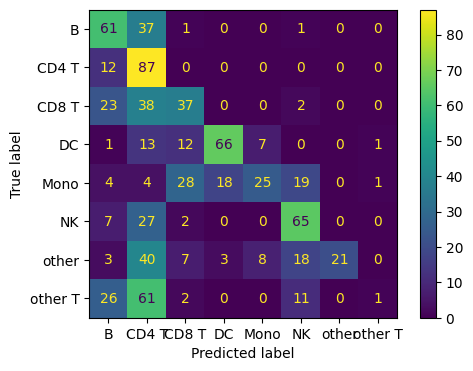

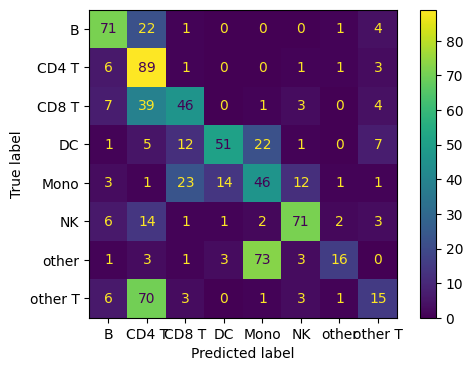

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.347,
lv2 matching acc: 0.253.
For All matchings: FOSCTTM score: 0.38819574, 
Knn Alignment score: [0.     0.0001 0.0003 0.0005 0.0007 0.0008 0.0009 0.001  0.0012 0.0014
 0.0016 0.0019 0.0019 0.0022 0.0024 0.0025 0.0026 0.0026 0.0027 0.0028
 0.0029 0.0031 0.0032 0.0032 0.0032]
For All matchings: Silhouette F1 score for lv1: 0.4928616044683552, 
Silhouette F1 score for lv2: 0.47547960172184256



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.203832745552063
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.302,
lv2 matching acc: 0.207.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.342,
lv2 matching acc: 0.226.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


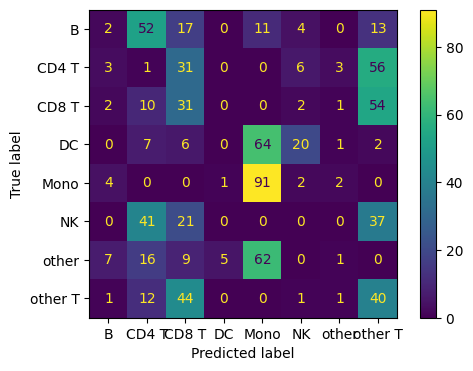

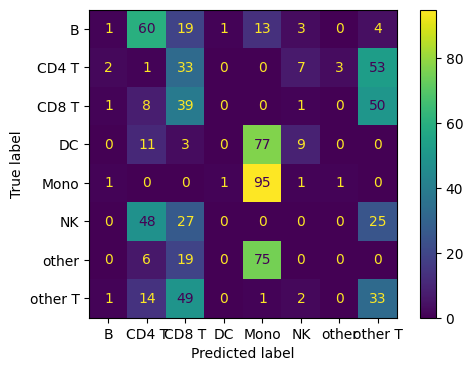

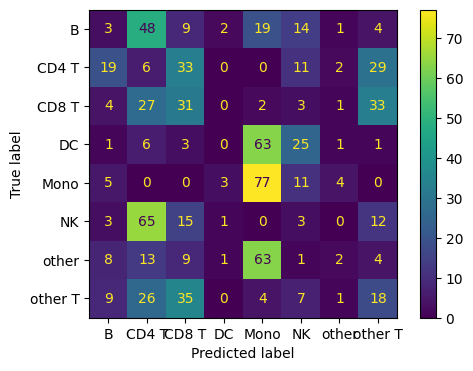

Epoch: 701: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 701: 40it [00:05,  7.35it/s]
Epoch: 702: 40it [00:05,  7.44it/s]
Epoch: 703: 40it [00:05,  7.45it/s]
Epoch: 704: 40it [00:05,  7.33it/s]
Epoch: 705: 40it [00:05,  7.44it/s]
Epoch: 706: 40it [00:05,  7.42it/s]
Epoch: 707: 40it [00:05,  7.35it/s]
Epoch: 708: 40it [00:05,  7.37it/s]
Epoch: 709: 40it [00:05,  7.38it/s]
Epoch: 710: 40it [00:05,  7.33it/s]
Epoch: 711: 40it [00:05,  7.37it/s]
Epoch: 712: 40it [00:05,  7.26it/s]
Epoch: 713: 40it [00

Loss at iter 750 : 1795.0865669250488


Epoch: 751: 40it [00:05,  7.05it/s]
Epoch: 752: 40it [00:05,  7.10it/s]
Epoch: 753: 40it [00:05,  7.04it/s]
Epoch: 754: 40it [00:05,  7.08it/s]
Epoch: 755: 40it [00:05,  7.00it/s]
Epoch: 756: 40it [00:05,  7.05it/s]
Epoch: 757: 40it [00:05,  7.03it/s]
Epoch: 758: 40it [00:06,  6.59it/s]
Epoch: 759: 40it [00:05,  7.00it/s]
Epoch: 760: 40it [00:05,  7.12it/s]
Epoch: 761: 40it [00:05,  7.08it/s]
Epoch: 762: 40it [00:05,  6.96it/s]
Epoch: 763: 40it [00:05,  7.05it/s]
Epoch: 764: 40it [00:05,  7.01it/s]
Epoch: 765: 40it [00:05,  7.08it/s]
Epoch: 766: 40it [00:05,  6.98it/s]
Epoch: 767: 40it [00:05,  6.67it/s]
Epoch: 768: 40it [00:06,  6.65it/s]
Epoch: 769: 40it [00:06,  6.39it/s]
Epoch: 770: 40it [00:05,  6.67it/s]
Epoch: 771: 40it [00:06,  6.35it/s]
Epoch: 772: 40it [00:05,  7.09it/s]
Epoch: 773: 40it [00:06,  6.37it/s]
Epoch: 774: 40it [00:05,  6.74it/s]
Epoch: 775: 40it [00:05,  6.95it/s]
Epoch: 776: 40it [00:05,  7.07it/s]
Epoch: 777: 40it [00:05,  7.04it/s]
Epoch: 778: 40it [00:05,  7.

Loss at iter 800 : 1795.7731895446777


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


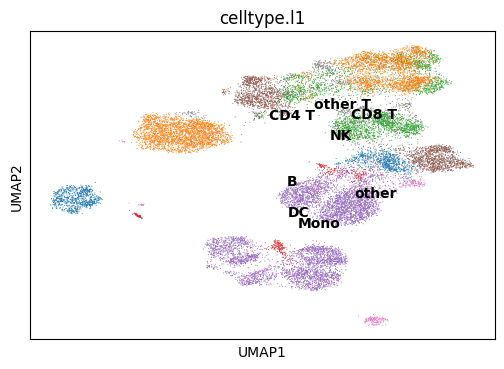

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


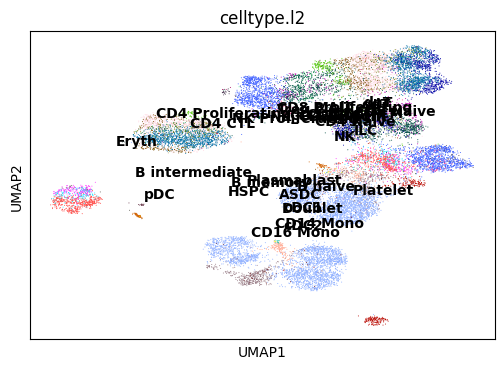

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


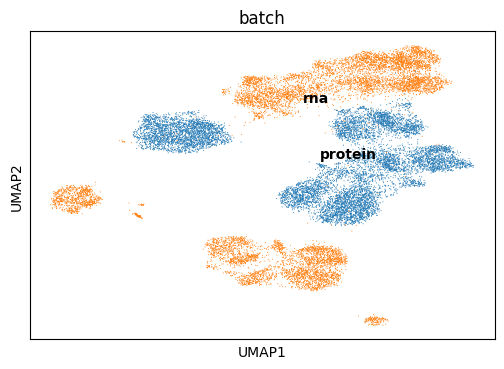

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


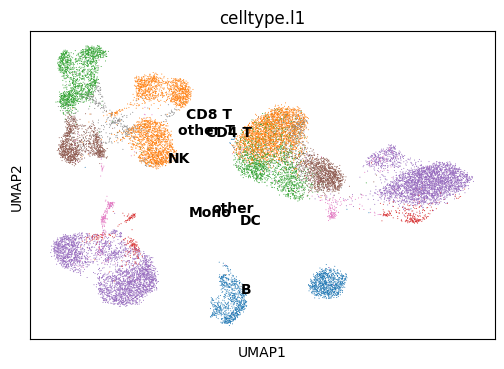

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


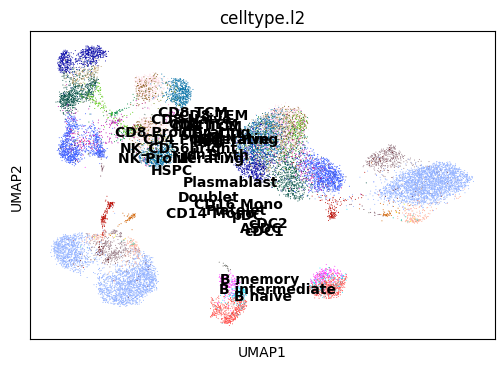

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


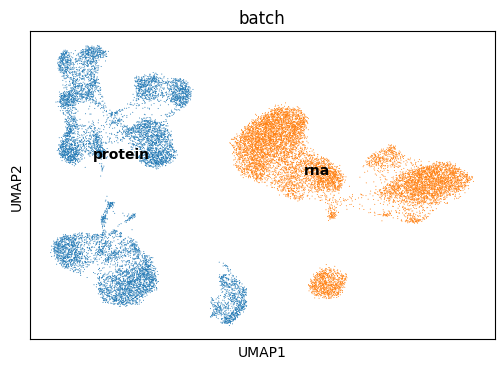

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.580,
lv2 matching acc: 0.316.
For All matchings: FOSCTTM score: 0.29151485, 
Knn Alignment score: [0.0012 0.0021 0.0033 0.0036 0.0042 0.0047 0.0057 0.0062 0.0068 0.0076
 0.0082 0.0087 0.0098 0.0103 0.0108 0.0113 0.012  0.0124 0.0127 0.0135
 0.0139 0.0144 0.015  0.016  0.0167]
For All matchings: Silhouette F1 score for lv1: 0.41995087769209044, 
Silhouette F1 score for lv2: 0.4117304982425302



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.728168964385986
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.624,
lv2 matching acc: 0.295.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.539,
lv2 matching acc: 0.377.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


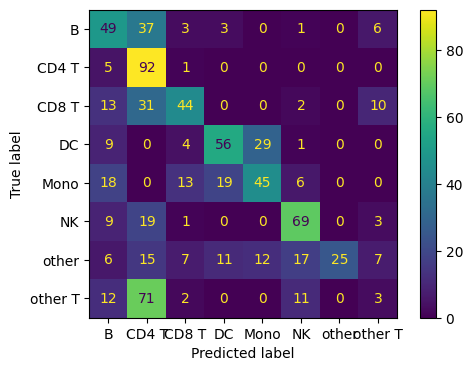

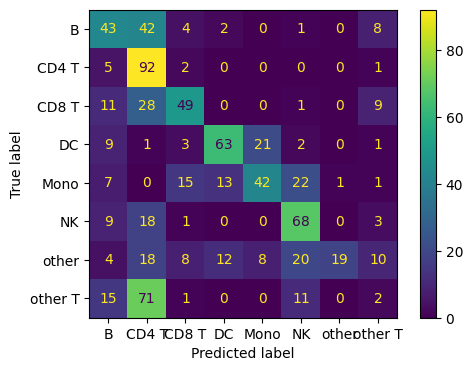

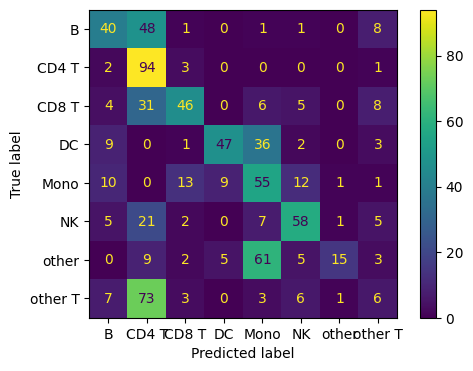

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.356,
lv2 matching acc: 0.258.
For All matchings: FOSCTTM score: 0.35613323, 
Knn Alignment score: [0.     0.0001 0.0001 0.0001 0.0003 0.0006 0.001  0.0015 0.0017 0.0018
 0.0019 0.0022 0.0024 0.0026 0.0027 0.0028 0.0029 0.0029 0.003  0.003
 0.0033 0.0033 0.0034 0.0035 0.0039]
For All matchings: Silhouette F1 score for lv1: 0.49169037156057915, 
Silhouette F1 score for lv2: 0.47486839973781825



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.043589949607849
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.326,
lv2 matching acc: 0.223.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.338,
lv2 matching acc: 0.221.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


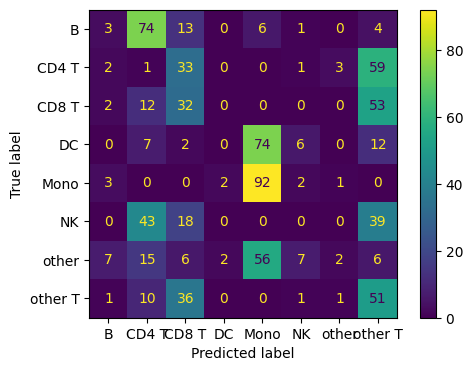

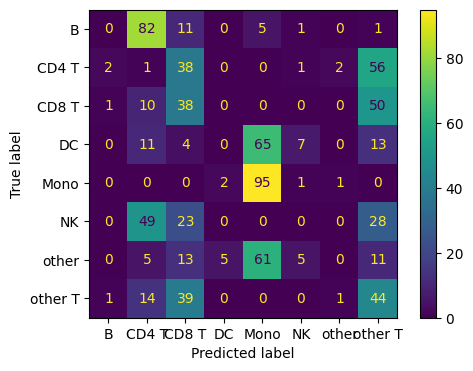

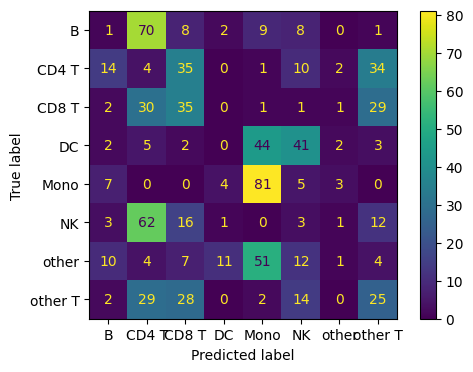

Epoch: 801: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 801: 40it [00:05,  7.36it/s]
Epoch: 802: 40it [00:05,  7.43it/s]
Epoch: 803: 40it [00:05,  7.39it/s]
Epoch: 804: 40it [00:05,  7.11it/s]
Epoch: 805: 40it [00:05,  7.32it/s]
Epoch: 806: 40it [00:05,  7.31it/s]
Epoch: 807: 40it [00:05,  7.36it/s]
Epoch: 808: 40it [00:05,  7.28it/s]
Epoch: 809: 40it [00:05,  7.39it/s]
Epoch: 810: 40it [00:05,  7.31it/s]
Epoch: 811: 40it [00:05,  7.32it/s]
Epoch: 812: 40it [00:05,  7.31it/s]
Epoch: 813: 40it [00

Loss at iter 850 : 1786.5112571716309


Epoch: 851: 40it [00:05,  7.82it/s]
Epoch: 852: 40it [00:05,  7.79it/s]
Epoch: 853: 40it [00:05,  7.77it/s]
Epoch: 854: 40it [00:05,  7.79it/s]
Epoch: 855: 40it [00:05,  7.80it/s]
Epoch: 856: 40it [00:05,  7.76it/s]
Epoch: 857: 40it [00:05,  7.79it/s]
Epoch: 858: 40it [00:05,  7.76it/s]
Epoch: 859: 40it [00:05,  7.87it/s]
Epoch: 860: 40it [00:05,  7.81it/s]
Epoch: 861: 40it [00:05,  7.84it/s]
Epoch: 862: 40it [00:05,  7.80it/s]
Epoch: 863: 40it [00:05,  7.74it/s]
Epoch: 864: 40it [00:05,  7.77it/s]
Epoch: 865: 40it [00:05,  7.74it/s]
Epoch: 866: 40it [00:05,  7.61it/s]
Epoch: 867: 40it [00:05,  7.22it/s]
Epoch: 868: 40it [00:05,  7.76it/s]
Epoch: 869: 40it [00:05,  7.88it/s]
Epoch: 870: 40it [00:05,  7.89it/s]
Epoch: 871: 40it [00:05,  7.90it/s]
Epoch: 872: 40it [00:05,  7.87it/s]
Epoch: 873: 40it [00:05,  7.62it/s]
Epoch: 874: 40it [00:05,  7.70it/s]
Epoch: 875: 40it [00:05,  7.89it/s]
Epoch: 876: 40it [00:05,  7.64it/s]
Epoch: 877: 40it [00:05,  7.76it/s]
Epoch: 878: 40it [00:05,  7.

Loss at iter 900 : 1788.1615676879883


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


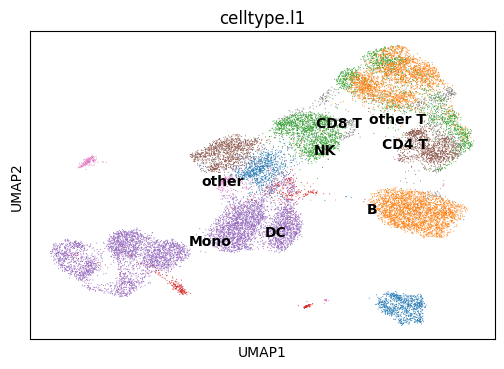

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


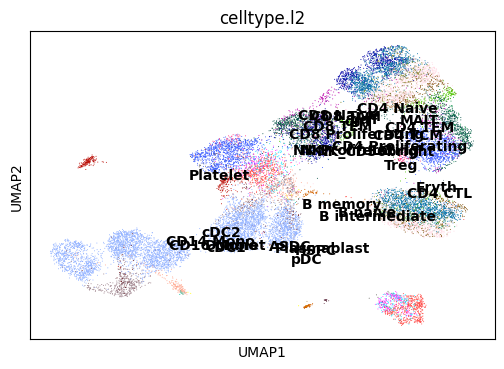

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


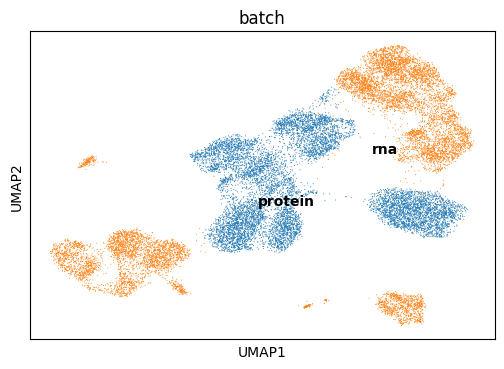

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


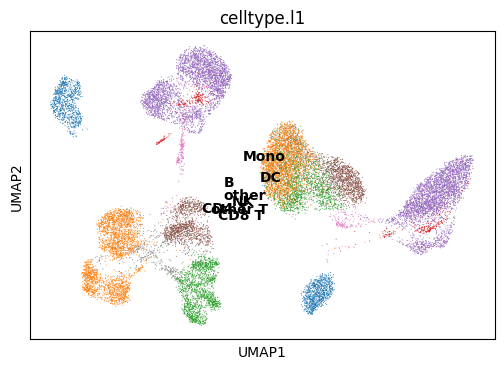

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


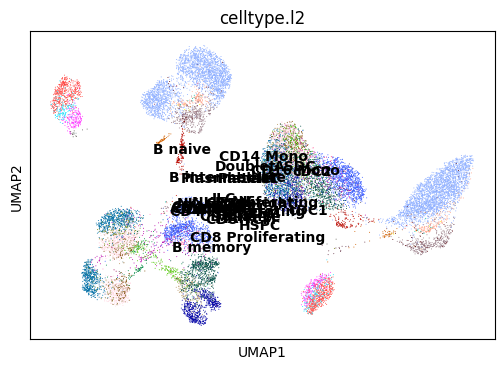

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


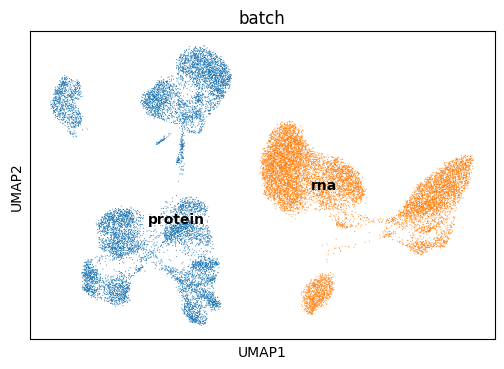

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.535,
lv2 matching acc: 0.310.
For All matchings: FOSCTTM score: 0.26888797, 
Knn Alignment score: [0.0007 0.0014 0.0025 0.0031 0.0037 0.0044 0.0051 0.0058 0.0065 0.0068
 0.0072 0.0081 0.0088 0.0095 0.01   0.0103 0.0106 0.0112 0.0118 0.0119
 0.0126 0.0131 0.0139 0.014  0.0146]
For All matchings: Silhouette F1 score for lv1: 0.4268872971058664, 
Silhouette F1 score for lv2: 0.4170529364176361



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.538827419281006
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.587,
lv2 matching acc: 0.361.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.613,
lv2 matching acc: 0.440.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


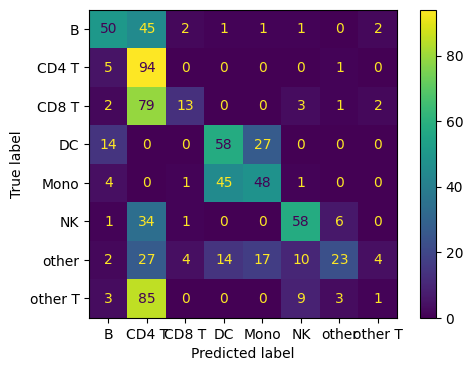

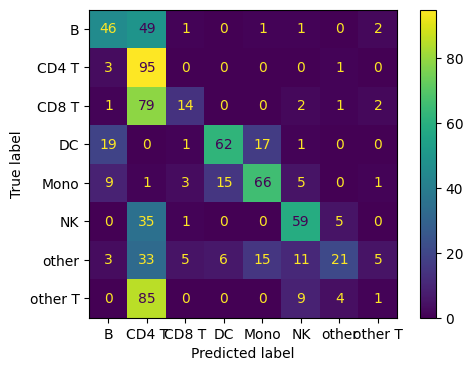

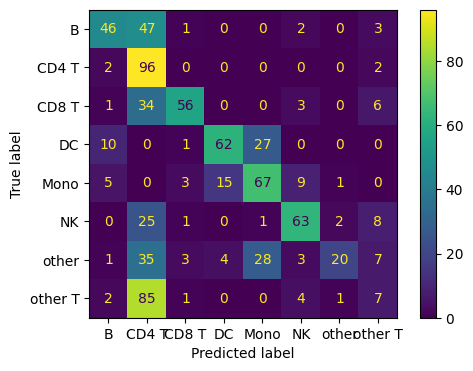

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.349,
lv2 matching acc: 0.269.
For All matchings: FOSCTTM score: 0.33536632, 
Knn Alignment score: [0.0003 0.0006 0.0008 0.0009 0.001  0.0012 0.0016 0.002  0.002  0.0022
 0.0022 0.0028 0.003  0.0033 0.0037 0.0038 0.0038 0.0039 0.0041 0.0044
 0.0044 0.0047 0.0048 0.0049 0.0052]
For All matchings: Silhouette F1 score for lv1: 0.48887626348766006, 
Silhouette F1 score for lv2: 0.471428410413596



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.895756244659424
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.303,
lv2 matching acc: 0.227.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.334,
lv2 matching acc: 0.218.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


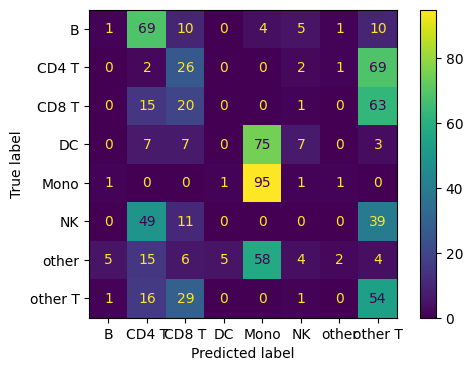

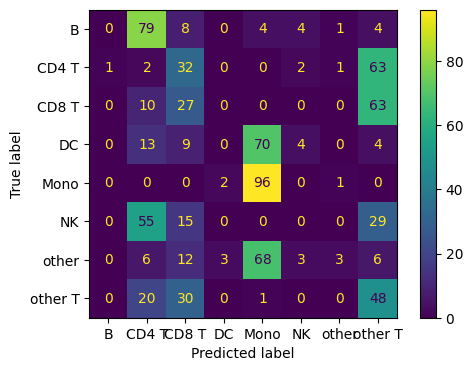

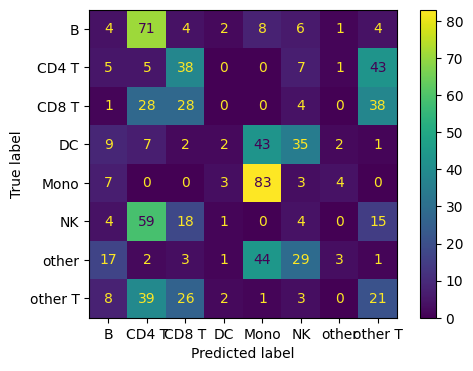

Epoch: 901: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_11476\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 901: 40it [00:05,  7.22it/s]
Epoch: 902: 40it [00:05,  7.75it/s]
Epoch: 903: 40it [00:05,  7.67it/s]
Epoch: 904: 40it [00:05,  7.74it/s]
Epoch: 905: 40it [00:05,  7.77it/s]
Epoch: 906: 40it [00:05,  7.72it/s]
Epoch: 907: 40it [00:05,  7.72it/s]
Epoch: 908: 40it [00:05,  7.77it/s]
Epoch: 909: 40it [00:05,  7.69it/s]
Epoch: 910: 40it [00:05,  7.81it/s]
Epoch: 911: 40it [00:05,  7.72it/s]
Epoch: 912: 40it [00:05,  7.66it/s]
Epoch: 913: 40it [00

Loss at iter 950 : 1781.466724395752


Epoch: 951: 40it [00:05,  7.56it/s]
Epoch: 952: 40it [00:05,  7.50it/s]
Epoch: 953: 40it [00:05,  7.43it/s]
Epoch: 954: 40it [00:05,  7.51it/s]
Epoch: 955: 40it [00:05,  7.23it/s]
Epoch: 956: 40it [00:05,  7.26it/s]
Epoch: 957: 40it [00:05,  7.41it/s]
Epoch: 958: 40it [00:05,  7.28it/s]
Epoch: 959: 40it [00:05,  7.24it/s]
Epoch: 960: 40it [00:05,  7.37it/s]
Epoch: 961: 40it [00:05,  7.36it/s]
Epoch: 962: 40it [00:05,  7.34it/s]
Epoch: 963: 40it [00:05,  7.34it/s]
Epoch: 964: 40it [00:05,  7.39it/s]
Epoch: 965: 40it [00:05,  7.43it/s]
Epoch: 966: 40it [00:05,  7.28it/s]
Epoch: 967: 40it [00:05,  6.85it/s]
Epoch: 968: 40it [00:05,  6.77it/s]
Epoch: 969: 40it [00:05,  7.19it/s]
Epoch: 970: 40it [00:05,  7.32it/s]
Epoch: 971: 40it [00:05,  7.40it/s]
Epoch: 972: 40it [00:05,  7.45it/s]
Epoch: 973: 40it [00:05,  7.46it/s]
Epoch: 974: 40it [00:05,  7.44it/s]
Epoch: 975: 40it [00:05,  7.47it/s]
Epoch: 976: 40it [00:05,  7.46it/s]
Epoch: 977: 40it [00:05,  7.44it/s]
Epoch: 978: 40it [00:05,  7.

Loss at iter 1000 : 1780.4154472351074


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


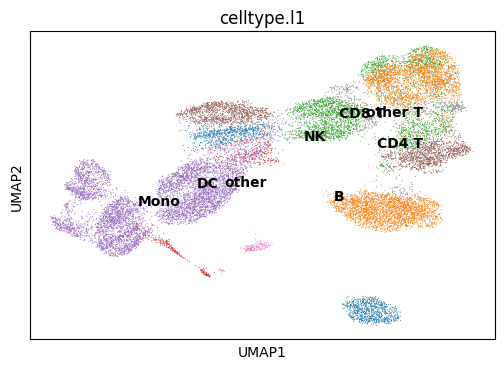

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


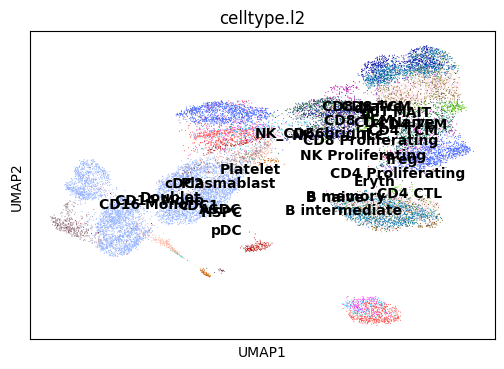

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


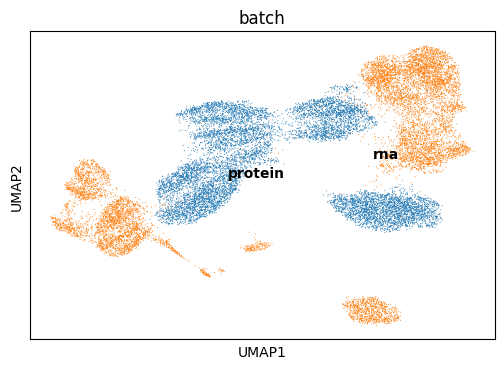

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


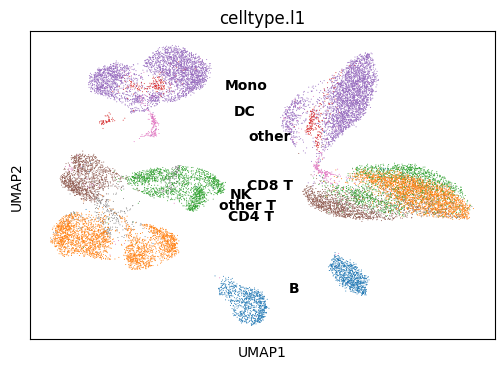

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


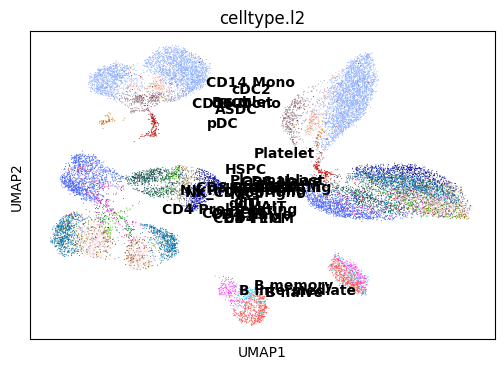

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


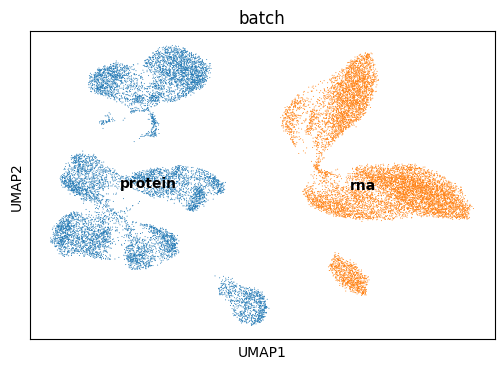

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.515,
lv2 matching acc: 0.290.
For All matchings: FOSCTTM score: 0.26267814, 
Knn Alignment score: [0.001  0.0014 0.0019 0.0025 0.0029 0.0032 0.0035 0.0039 0.0044 0.0049
 0.0058 0.006  0.0063 0.0067 0.0078 0.0088 0.0095 0.0097 0.0102 0.0106
 0.011  0.0118 0.0124 0.0129 0.0133]
For All matchings: Silhouette F1 score for lv1: 0.4364754903892765, 
Silhouette F1 score for lv2: 0.4251638846123608



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.230070352554321


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


Matchings are reduced to 5000 after filtering...
For only filtered matchings: lv1 matching acc: 0.568,
lv2 matching acc: 0.263.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.561,
lv2 matching acc: 0.413.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


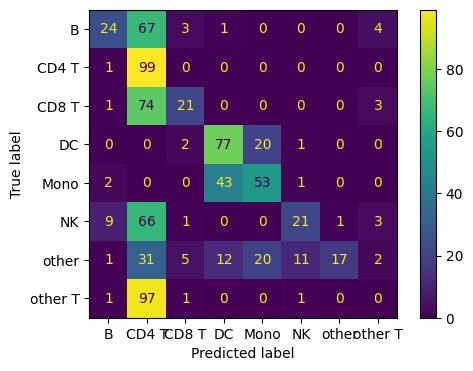

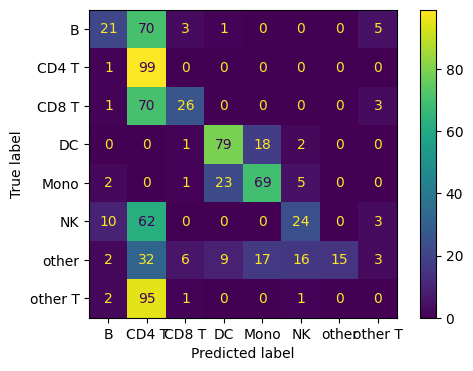

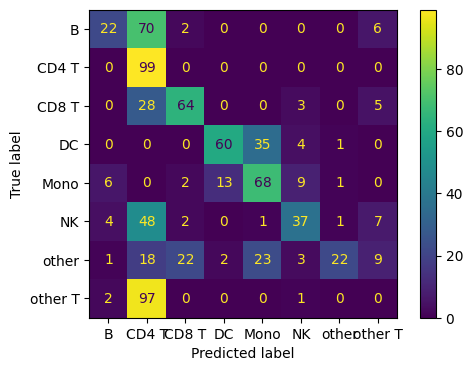

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.355,
lv2 matching acc: 0.267.
For All matchings: FOSCTTM score: 0.32042933999999995, 
Knn Alignment score: [0.     0.0001 0.0002 0.0008 0.0009 0.0011 0.0012 0.0014 0.0016 0.0018
 0.0019 0.0019 0.0019 0.0023 0.0025 0.0027 0.0028 0.003  0.0032 0.0032
 0.0032 0.0035 0.0037 0.004  0.0041]
For All matchings: Silhouette F1 score for lv1: 0.4895189631301797, 
Silhouette F1 score for lv2: 0.471868486004372



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.66841459274292
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.341,
lv2 matching acc: 0.252.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.332,
lv2 matching acc: 0.216.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


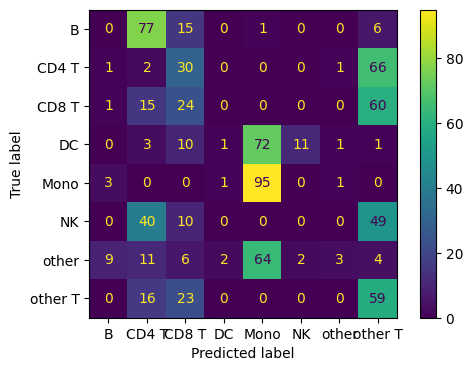

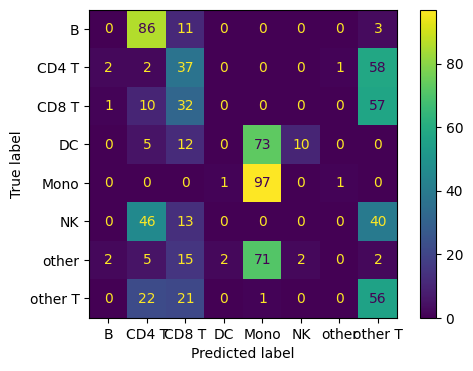

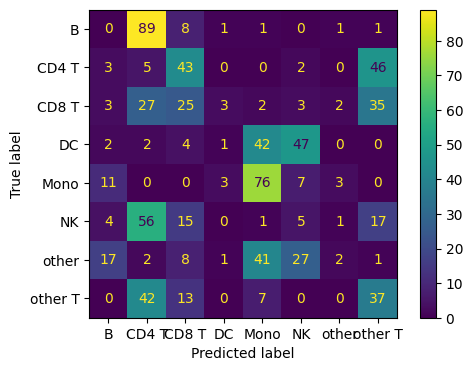

In [13]:
loss_list = []
metrics = {
    'original': {
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'filtered':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'propagated':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    }
}
metrics2 = {
    'original': {
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'filtered':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'propagated':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    }
}
for epoch in range(1001):
    loss_per_iter = 0.0
    for batchr, batchp in tqdm(zip(rna_dataloader, protein_dataloader), desc="Epoch: {}".format(epoch)):
        optimizer_net.zero_grad()
        y_shared = batchp["y_shared"].to(device)
        x_shared = batchr["x_shared"].to(device)
        y_unshared = batchp["y_unshared"].to(device)
        x_unshared = batchr["x_unshared"].to(device)
        x_batch_id = batchr["batch"].to(device)
        y_batch_id = batchp["batch"].to(device)
        inputs = {}
        inputs["x_unshared"] = x_unshared
        inputs["x_shared"] = x_shared
        inputs["y_unshared"] = y_unshared
        inputs["y_shared"] = y_shared
        inputs["x_batch_id"] = x_batch_id
        inputs["y_batch_id"] = y_batch_id
        loss, latents = net(inputs)
        loss.backward()
        optimizer_net.step()
        loss_per_iter += loss.item()
    loss_list.append(loss_per_iter/len(rna_dataset))
    
    if epoch%50 == 0:
        print("Loss at iter {} : {}".format(epoch,loss_per_iter))
        
    if epoch%100 == 0:
        with torch.no_grad():
            inputs = {}
            inputs["x_unshared"] = torch.Tensor(rna_dataset.unshared_data)
            inputs["x_shared"] = torch.Tensor(rna_dataset.shared_data)
            inputs["y_unshared"] = torch.Tensor(protein_dataset.unshared_data)
            inputs["y_shared"] = torch.Tensor(protein_dataset.shared_data)
            inputs["x_batch_id"] = torch.Tensor(rna_dataset.batch)
            inputs["y_batch_id"] = torch.Tensor(protein_dataset.batch)
            
            _, z = net(inputs)
            labelsl1 = rna_dataset.labels_l1
            labelsl2 = rna_dataset.labels_l2
            adata_plot = ad.AnnData(X= np.concatenate([z["unshared_rna"].numpy(), z["unshared_adt"]], axis=0))
            adata_plot.obs['celltype.l1'] = np.concatenate([labelsl1,labels_l1], axis=0)
            adata_plot.obs['celltype.l2'] = np.concatenate([labelsl2,labels_l2], axis=0)
            adata_plot.obs['batch'] = np.concatenate([["rna"]*10000, ["protein"]*10000], axis=0)
            sc.pp.neighbors(adata_plot)
            sc.tl.umap(adata_plot)
            sc.pl.umap(adata_plot, color='celltype.l1', legend_loc='on data', s=2)            
            sc.pl.umap(adata_plot, color='celltype.l2', legend_loc='on data', s=2)
            sc.pl.umap(adata_plot, color='batch', legend_loc='on data', s=2)    
            
            adata_plot = ad.AnnData(X=z["shared"].numpy())
            adata_plot.obs['celltype.l1'] = np.concatenate([labelsl1,labels_l1], axis=0)
            adata_plot.obs['celltype.l2'] = np.concatenate([labelsl2,labels_l2], axis=0)
            adata_plot.obs['batch'] = np.concatenate([["rna"]*10000, ["protein"]*10000], axis=0)
            sc.pp.neighbors(adata_plot)
            sc.tl.umap(adata_plot)
            sc.pl.umap(adata_plot, color='celltype.l1', legend_loc='on data', s=2)            
            sc.pl.umap(adata_plot, color='celltype.l2', legend_loc='on data', s=2)
            sc.pl.umap(adata_plot, color='batch', legend_loc='on data', s=2) 
            
            met = mu.get_all_metrics(z["shared"].numpy()[:10000], z["shared"].numpy()[10000:], labelsl1, labelsl2, dim_use = 20, k_max=25, metric='euclidean', assignment_type='mindist', filter_prop=0.5, verbose=True)
            metrics['original']['lv1_acc'].append(met['original']['lv1_acc'])
            metrics['original']['lv2_acc'].append(met['original']['lv2_acc'])
            metrics['original']['foscttm_score'].append(met['original']['foscttm_score'])
            metrics['filtered']['lv1_acc'].append(met['filtered']['lv1_acc'])
            metrics['filtered']['lv2_acc'].append(met['filtered']['lv2_acc'])
            metrics['filtered']['foscttm_score'].append(met['filtered']['foscttm_score'])
            metrics['propagated']['lv1_acc'].append(met['propagated']['lv1_acc'])
            metrics['propagated']['lv2_acc'].append(met['propagated']['lv2_acc'])
            metrics['propagated']['foscttm_score'].append(met['propagated']['foscttm_score'])
            
            met = mu.get_all_metrics(z["unshared_rna"].numpy(), z["unshared_adt"].numpy(), labelsl1, labelsl2, dim_use = 20, k_max=25, metric='euclidean', assignment_type='mindist', filter_prop=0.5, verbose=True)
            metrics2['original']['lv1_acc'].append(met['original']['lv1_acc'])
            metrics2['original']['lv2_acc'].append(met['original']['lv2_acc'])
            metrics2['original']['foscttm_score'].append(met['original']['foscttm_score'])
            metrics2['filtered']['lv1_acc'].append(met['filtered']['lv1_acc'])
            metrics2['filtered']['lv2_acc'].append(met['filtered']['lv2_acc'])
            metrics2['filtered']['foscttm_score'].append(met['filtered']['foscttm_score'])
            metrics2['propagated']['lv1_acc'].append(met['propagated']['lv1_acc'])
            metrics2['propagated']['lv2_acc'].append(met['propagated']['lv2_acc'])
            metrics2['propagated']['foscttm_score'].append(met['propagated']['foscttm_score'])